In [1]:
import scanpy as sc
import os
import math
import itertools
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import igraph as ig
import leidenalg as la
import scanpy.external as sce
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.pyplot import rc_context
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
warnings.filterwarnings("ignore")
plt.rc('font',family='Arial')
sc.settings.verbosity = 3  # 输出提示信息
sc.logging.print_header()         
sc.settings.set_figure_params(dpi=100, facecolor='white', frameon=False)# 设置输出图像格式

scanpy==1.10.2 anndata==0.10.8 numpy==1.26.4 scipy==1.13.1 pandas==2.3.1 scikit-learn==1.4.2 statsmodels==0.14.2 igraph==0.11.6 pynndescent==0.5.13


# 1. Load + 调整

In [2]:
import os
os.getcwd()
os.chdir(r"H:\Analysis\Python_code\results")      
os.getcwd()
#adata = sc.read("test2.h5ad")
#adata

'H:\\Analysis\\Python_code\\results'

In [3]:
adata.obs.columns

NameError: name 'adata' is not defined

In [4]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,orig.Cluster,ident,celltype,status,total_celltype,label.fine
AAACCTGAGCATGGCA-1,0,3645.0,1696,5,1,CD14,YA,Mono,CD14
AAACCTGAGCGTAGTG-1,0,966.0,647,11,1,CD4 Tem,YA,TC,CD4 Tem
AAACCTGAGCTGATAA-1,0,3521.0,1612,5,1,CD14,YA,Mono,CD14
AAACCTGAGGCCCTTG-1,0,3597.0,1632,46,1,CD14,YA,Mono,CD14
AAACCTGAGGGCTCTC-1,0,1649.0,1011,2,1,NK3,YA,NK,NK3
...,...,...,...,...,...,...,...,...,...
TTTGTCAGTGCTGTAT-22,0,7460.0,2621,12,22,CD14,ACR,Mono,CD14
TTTGTCAGTTACCGAT-22,0,7801.0,2666,16,22,CD14,ACR,Mono,CD14
TTTGTCATCCACGCAG-22,0,5287.0,2018,12,22,CD14,ACR,Mono,CD14
TTTGTCATCCCAACGG-22,0,2422.0,1406,22,22,CD4 Tem,ACR,TC,CD4 Tem


In [5]:
adata.var_names

Index(['MIR1302-2HG', 'FAM138A', 'OR4F5', 'AL627309.1', 'AL627309.3',
       'AL627309.2', 'AL627309.4', 'AL732372.1', 'OR4F29', 'AC114498.1',
       ...
       'AC007325.2', 'BX072566.1', 'AL354822.1', 'AC023491.2', 'AC004556.1',
       'AC233755.2', 'AC233755.1', 'AC240274.1', 'AC213203.1', 'FAM231C'],
      dtype='object', length=33421)

保存raw数据

In [6]:
adata.raw = adata

In [7]:
adata.obs["status"]

AAACCTGAGCATGGCA-1      YA
AAACCTGAGCGTAGTG-1      YA
AAACCTGAGCTGATAA-1      YA
AAACCTGAGGCCCTTG-1      YA
AAACCTGAGGGCTCTC-1      YA
                      ... 
TTTGTCAGTGCTGTAT-22    ACR
TTTGTCAGTTACCGAT-22    ACR
TTTGTCATCCACGCAG-22    ACR
TTTGTCATCCCAACGG-22    ACR
TTTGTCATCGTACGGC-22    ACR
Name: status, Length: 205434, dtype: object

In [8]:
adata.obs["status"] = adata.obs["status"].astype("category")
adata.obs["status"].value_counts()

status
AA     88750
YA     79039
YCR    19533
ACR    18112
Name: count, dtype: int64

In [9]:
adata.obs["celltype"] = adata.obs["celltype"].astype("category")
adata.obs["celltype"].value_counts(normalize=True)

celltype
CD14         0.188158
CD4 Tem      0.116256
CD4 Naive    0.088744
NK3          0.082976
CD8 Naive    0.066776
CD8 CTL      0.062448
NK2          0.057722
BC Memory    0.048755
BC Naive     0.043834
CD4 Tcm      0.041799
CD8 Tem      0.041244
CD16         0.030170
MEGA         0.023891
CD4-CD8-     0.020508
CD4 Treg     0.016112
CD4+CD8+     0.015582
T-mito       0.015109
cDC          0.013445
RBC          0.010811
NK1          0.007268
ASC          0.005476
pDC          0.002916
Name: proportion, dtype: float64

In [10]:
adata.obs["total_celltype"] = adata.obs["total_celltype"].astype("category")
adata.obs["total_celltype"].value_counts(normalize=True)

total_celltype
TC          0.484579
Mono        0.218328
NK          0.147965
BC          0.098066
RGB_MEGA    0.034702
DC          0.016360
Name: proportion, dtype: float64

In [11]:
adata.obs["label.fine"] = adata.obs["label.fine"].astype("category")
adata.obs["label.fine"].value_counts(normalize=True)

label.fine
CD14         0.185724
CD4 Tem      0.116918
CD4 Naive    0.088861
NK3          0.082976
CD8 Naive    0.069200
CD8 CTL      0.062448
NK2          0.057722
BC Memory    0.048755
CD4 Tcm      0.045056
BC Naive     0.043834
CD8 Tem      0.041244
CD16         0.027488
MEGA         0.023891
CD4-CD8-     0.020508
CD4 Treg     0.016112
CD4+CD8+     0.015582
cDC          0.012909
RBC          0.010811
T-mito       0.008650
NK1          0.007268
ASC          0.005476
Intermed     0.005116
pDC          0.002916
cDC1         0.000535
Name: proportion, dtype: float64

In [12]:
adata.write('01_rawdata.h5ad')
adata

AnnData object with n_obs × n_vars = 205434 × 33421
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'

# 2. QC + pipeline

In [13]:
adata = sc.read('01_rawdata.h5ad')
adata

AnnData object with n_obs × n_vars = 205434 × 33421
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'

In [14]:
#先将Counts存一下，后面分析可能会变，存好原始数据
adata.layers["counts"]= adata.X.copy()

normalizing counts per cell
    finished (0:00:03)


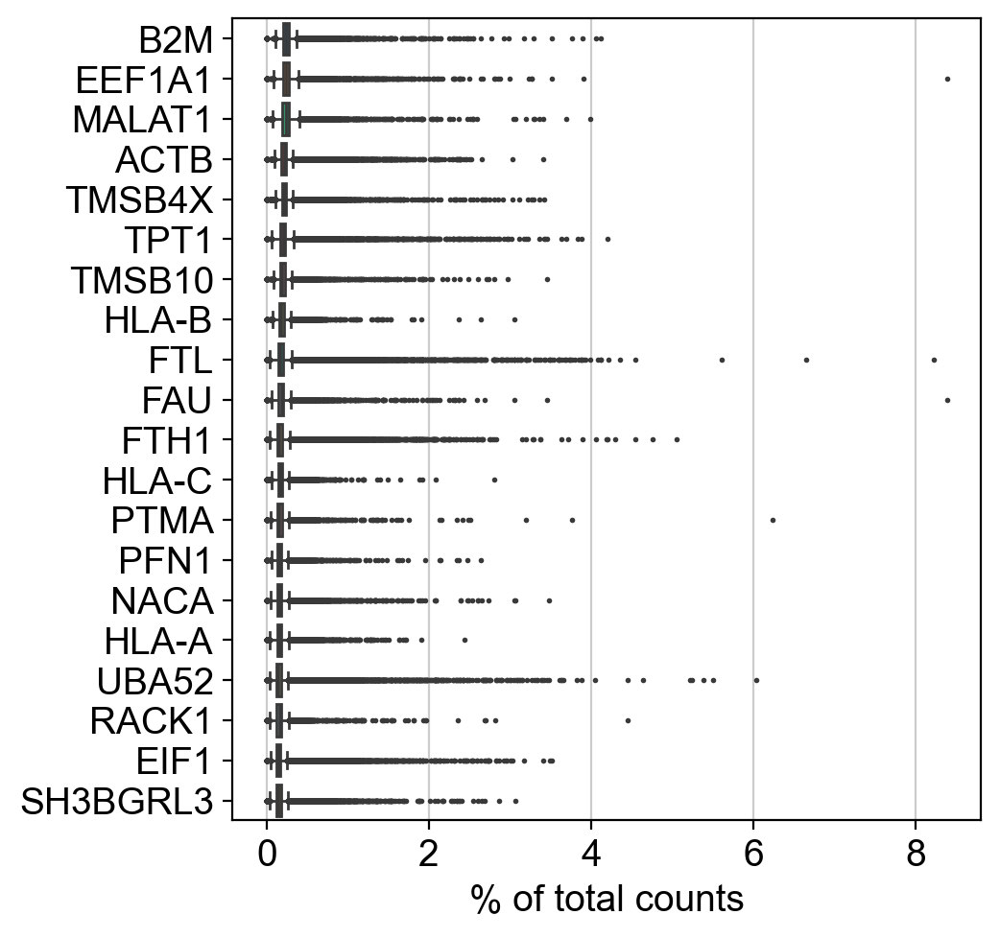

filtered out 1831 cells that have less than 200 genes expressed
filtered out 10540 genes that are detected in less than 3 cells


In [15]:
sc.pl.highest_expr_genes(adata,n_top=20)
sc.pp.filter_cells(adata,min_genes=200) 
sc.pp.filter_genes(adata,min_cells=3)

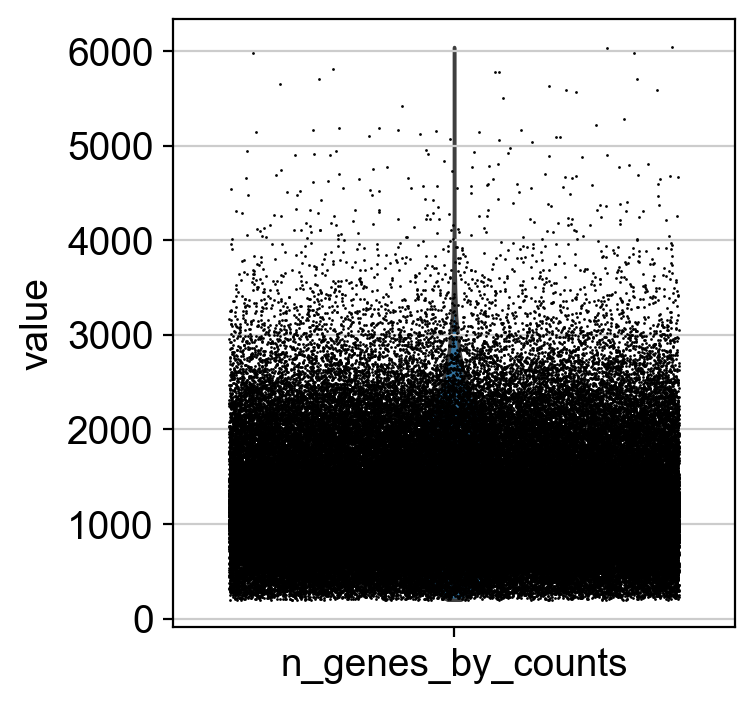

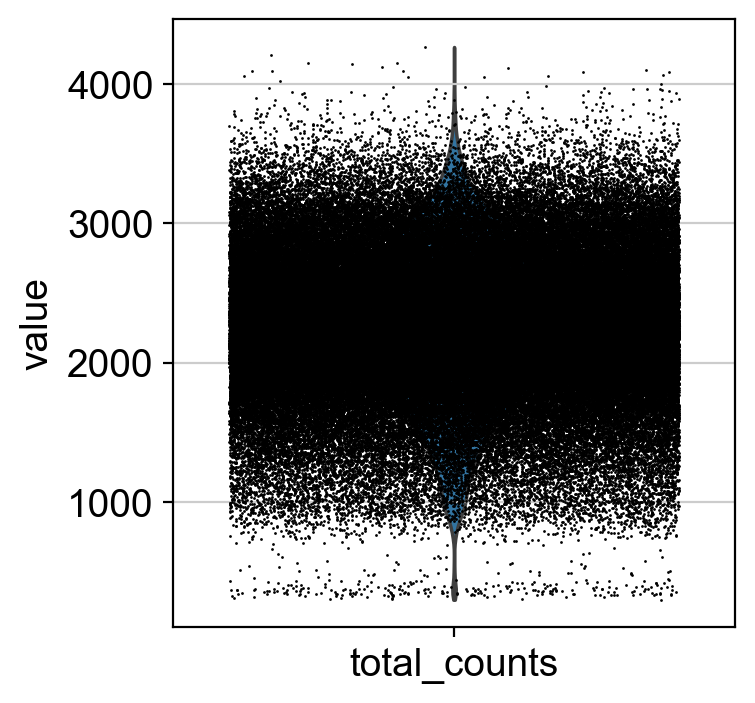

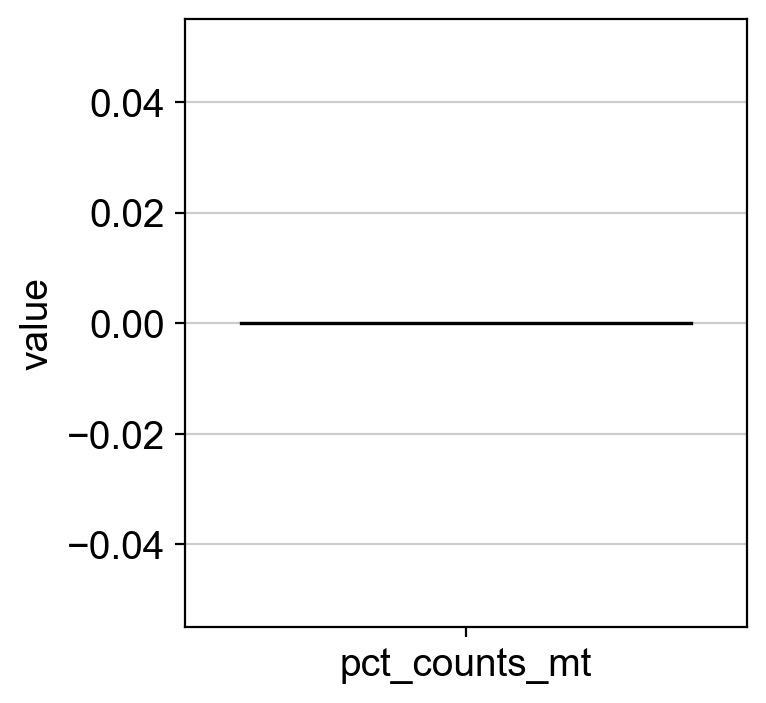

In [16]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

# Scanpy will prepend the string in the save argument with "violin"
# and save it to our figure directory defined in the first step.
sc.pl.violin(adata, ['n_genes_by_counts'], save='_n_genes', jitter=0.4)
sc.pl.violin(adata, ['total_counts'], save='_total_counts', jitter=0.4)
sc.pl.violin(adata, ['pct_counts_mt'], save='_mito_pct', jitter=0.4)

In [17]:
adata

AnnData object with n_obs × n_vars = 203603 × 22881
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'counts'

In [18]:
# Check cells counts after filtering before assigning
adata[(adata.obs.pct_counts_mt < 25) & 
(adata.obs.n_genes_by_counts < 5000) & 
(adata.obs.total_counts < 25000),:].shape

# Do the filtering
adata = adata[(adata.obs.pct_counts_mt < 25) & 
(adata.obs.n_genes_by_counts < 5000) & 
(adata.obs.total_counts < 25000),:]

In [19]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:04)


In [20]:
print(adata)

AnnData object with n_obs × n_vars = 203570 × 22881
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p'
    layers: 'counts'


In [21]:
# This saves the original set of genes 
adata.raw = adata
#高变基因
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.25)

adata = adata[:,adata.var.highly_variable]
print(adata)
sc.pp.scale(adata, max_value=10)

extracting highly variable genes
    finished (0:00:09)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
View of AnnData object with n_obs × n_vars = 203570 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


computing PCA


    with n_comps=50
    finished (0:01:27)


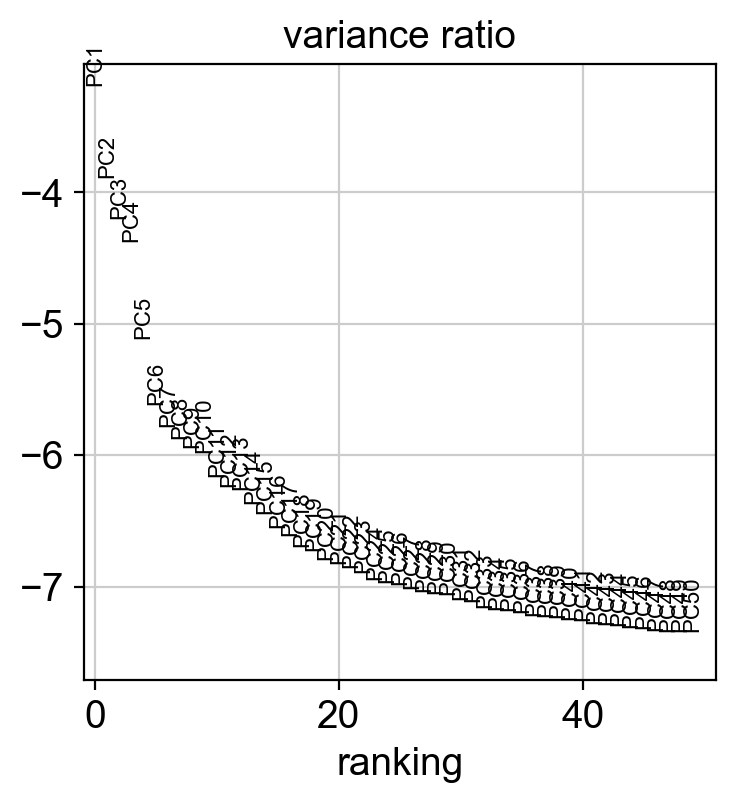

In [22]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50, save='') # scanpy generates the filename automatically

In [23]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.5)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:49)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:47)
running Leiden clustering
    finished: found 26 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:01)


In [24]:
def one_col_lgd(umap):
    legend = umap.legend(bbox_to_anchor=[1.00, 0.5],
    loc='center left', ncol=1, prop={'size': 6})
    legend.get_frame().set_linewidth(0.0)
    # for handle in legend.legend_Handles:
    #     handle.set_sizes([25.0])
    return legend

In [25]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,orig.Cluster,ident,celltype,status,total_celltype,label.fine,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
AAACCTGAGCATGGCA-1,0,3645.0,1696,5,1,CD14,YA,Mono,CD14,1696,1696,2726.021582,0.0,0.0,3
AAACCTGAGCGTAGTG-1,0,966.0,647,11,1,CD4 Tem,YA,TC,CD4 Tem,647,647,1671.360650,0.0,0.0,0
AAACCTGAGCTGATAA-1,0,3521.0,1612,5,1,CD14,YA,Mono,CD14,1612,1612,2633.419756,0.0,0.0,3
AAACCTGAGGCCCTTG-1,0,3597.0,1632,46,1,CD14,YA,Mono,CD14,1632,1632,2626.447678,0.0,0.0,3
AAACCTGAGGGCTCTC-1,0,1649.0,1011,2,1,NK3,YA,NK,NK3,1011,1011,2182.371438,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTGCTGTAT-22,0,7460.0,2621,12,22,CD14,ACR,Mono,CD14,2621,2621,3134.860614,0.0,0.0,4
TTTGTCAGTTACCGAT-22,0,7801.0,2666,16,22,CD14,ACR,Mono,CD14,2666,2666,3115.823592,0.0,0.0,12
TTTGTCATCCACGCAG-22,0,5287.0,2018,12,22,CD14,ACR,Mono,CD14,2018,2018,2838.305869,0.0,0.0,4
TTTGTCATCCCAACGG-22,0,2422.0,1406,22,22,CD4 Tem,ACR,TC,CD4 Tem,1406,1406,2646.062508,0.0,0.0,8


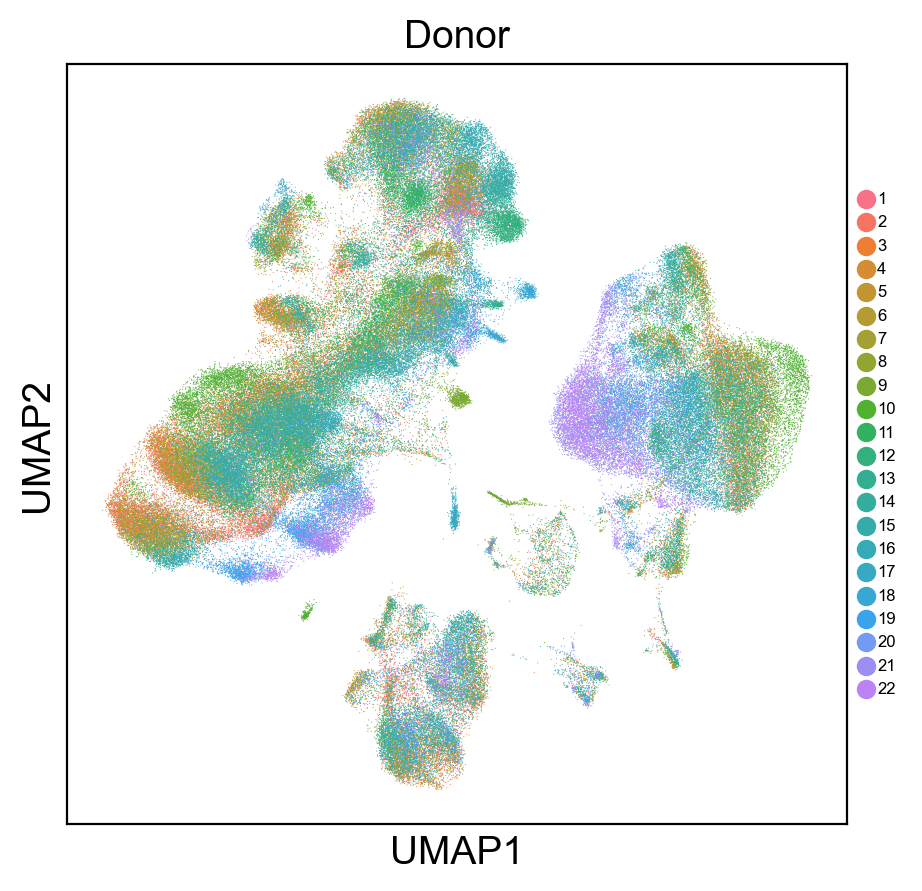

In [26]:
donor_umap = sc.pl.umap(adata, color=['ident'],
show=False, palette=sns.color_palette("husl", 27),
    legend_fontsize=6, frameon=True, title='Donor')

lgd = one_col_lgd(donor_umap)

fig = donor_umap.get_figure()
fig.set_size_inches(5, 5)
fig.savefig(str(sc.settings.figdir) + '/umap_lgd_ident',
    dpi=400, bbox_extra_artists=(lgd,), bbox_inches='tight')

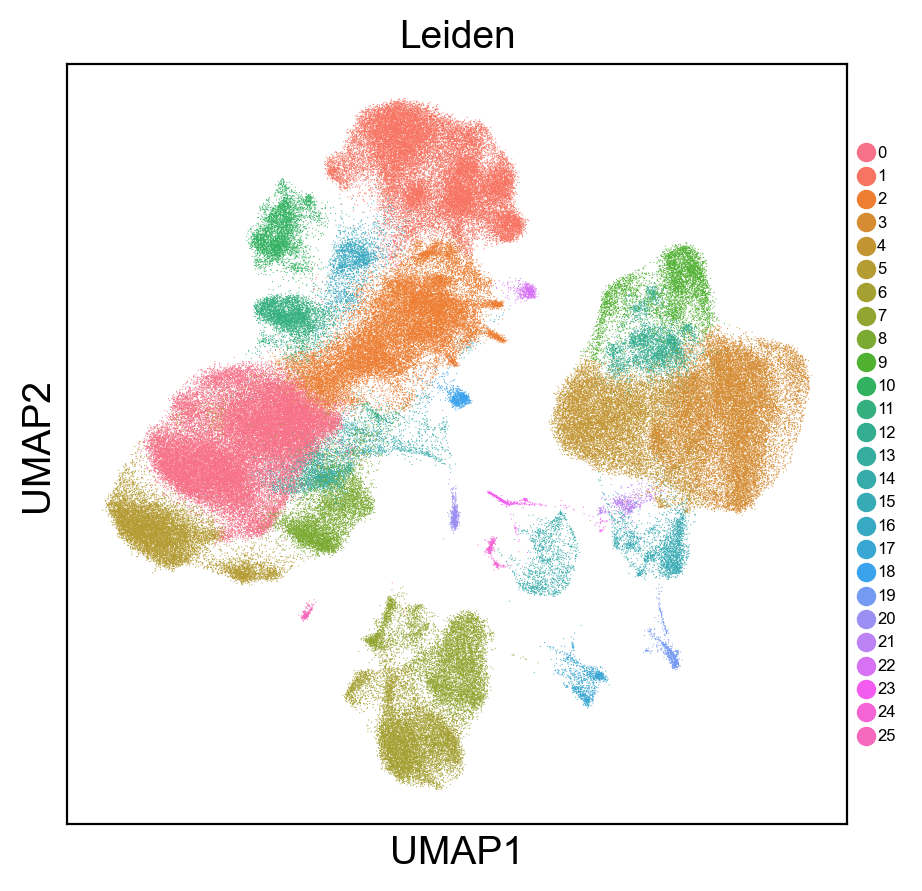

In [27]:
leiden_umap = sc.pl.umap(adata, color=['leiden'],
    show=False, palette=sns.color_palette("husl", 27),
legend_fontsize=6, frameon=True, title='Leiden')

lgd = one_col_lgd(leiden_umap)

fig = leiden_umap.get_figure()
fig.set_size_inches(5, 5)
fig.savefig(str(sc.settings.figdir) + '/umap_lgd_leiden',
    dpi=400, bbox_extra_artists=(lgd,), bbox_inches='tight')

In [28]:
adata.write('02_before harmony.h5ad')

# 3. harmony

In [ ]:
adata = sc.read('02_before harmony.h5ad')
adata

In [29]:
adata.obs['ident'].value_counts()

ident
15    14347
11    12255
1     12150
13    11719
10    11503
3     11093
2     10847
5     10644
16    10458
9     10037
4      9221
22     9171
12     9094
6      8975
8      8057
14     7799
7      7764
19     7006
17     6709
21     6126
18     5800
20     2795
Name: count, dtype: int64

In [30]:
adata.obs['orig.ident'].value_counts()

orig.ident
0    203570
Name: count, dtype: int64

In [31]:
#Harmony去批次
import harmonypy
sce.pp.harmony_integrate(adata, 'ident')

2024-12-20 10:39:22,949 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-12-20 10:39:46,348 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-20 10:39:47,178 - harmonypy - INFO - Iteration 1 of 10
2024-12-20 10:40:58,865 - harmonypy - INFO - Iteration 2 of 10
2024-12-20 10:42:11,095 - harmonypy - INFO - Iteration 3 of 10
2024-12-20 10:43:25,010 - harmonypy - INFO - Iteration 4 of 10
2024-12-20 10:44:39,318 - harmonypy - INFO - Iteration 5 of 10
2024-12-20 10:45:51,052 - harmonypy - INFO - Converged after 5 iterations


In [32]:
adata.obsm['X_pca'] = adata.obsm['X_pca_harmony']
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=50)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.5)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:22)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:49)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:59)


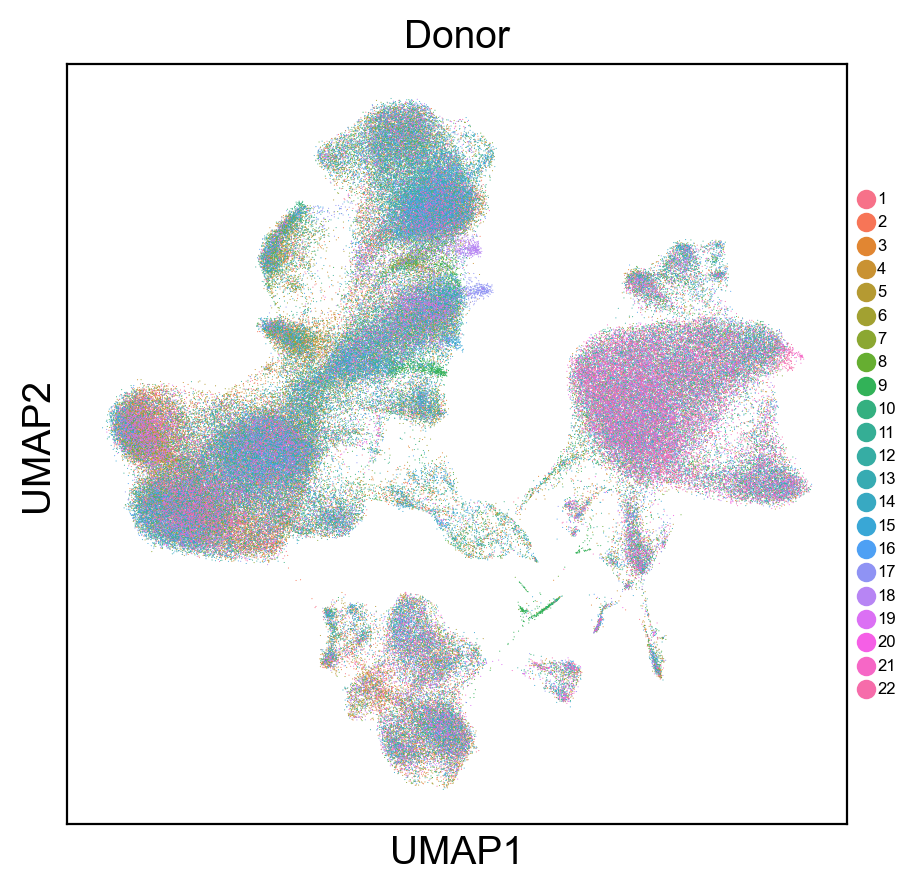

In [33]:
donor_umap = sc.pl.umap(adata, color=['ident'],
    show=False, palette=sns.color_palette("husl", 22),
legend_fontsize=6, frameon=True, title='Donor')

lgd = one_col_lgd(donor_umap)

fig = donor_umap.get_figure()
fig.set_size_inches(5, 5)
fig.savefig(str(sc.settings.figdir) + '/umap_lgd_harmony_ident',
    dpi=400, bbox_extra_artists=(lgd,), bbox_inches='tight')

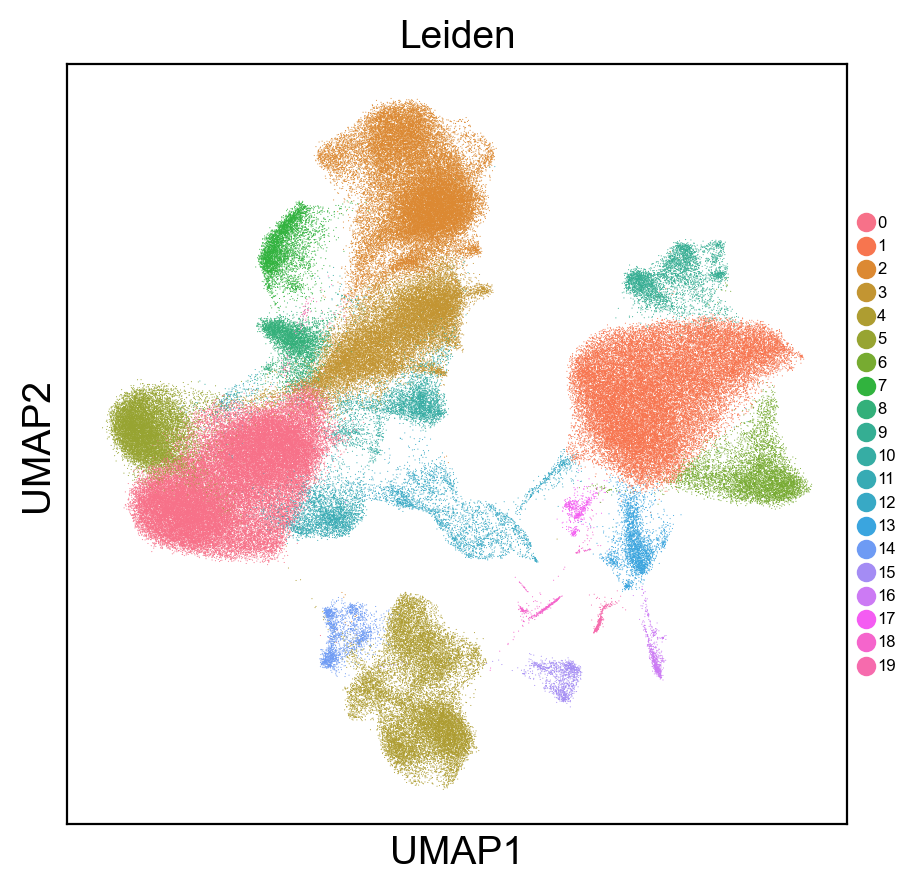

In [34]:
leiden_umap = sc.pl.umap(adata, color=['leiden'],
show=False, palette=sns.color_palette("husl", 20),
    legend_fontsize=6, frameon=True, title='Leiden')

lgd = one_col_lgd(leiden_umap)

fig = leiden_umap.get_figure()
fig.set_size_inches(5, 5)
fig.savefig(str(sc.settings.figdir) + '/umap_lgd_harmony_leiden',
    dpi=400, bbox_extra_artists=(lgd,), bbox_inches='tight')

In [35]:
adata.write('03_after harmony.h5ad')
adata

AnnData object with n_obs × n_vars = 203570 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'ident_colors', 'leiden_colors'
    obsm: 'X_pca', 'X_umap', 'X_pca_harmony'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

# 4. 细胞注释

In [4]:
adata = sc.read('03_after harmony.h5ad')
adata

AnnData object with n_obs × n_vars = 203570 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'ident_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [5]:
import matplotlib.pyplot as plt 
from matplotlib.backends.backend_pdf import PdfPages

In [6]:
os.getcwd()

'H:\\Analysis\\Python_code\\results'

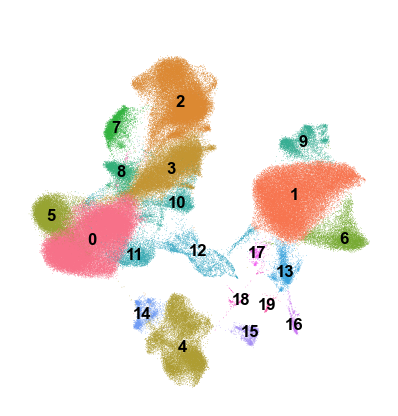

In [7]:
sc.settings.set_figure_params(dpi=60,dpi_save=600)
sc.pl.umap(
    adata, color = ["leiden"],
    legend_loc = "on data", legend_fontsize=10, frameon=False,
    palette=sns.color_palette("husl", 20)
    , title=' ',save='Leiden.pdf'
)


AnnData object with n_obs × n_vars = 203570 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'ident_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to b

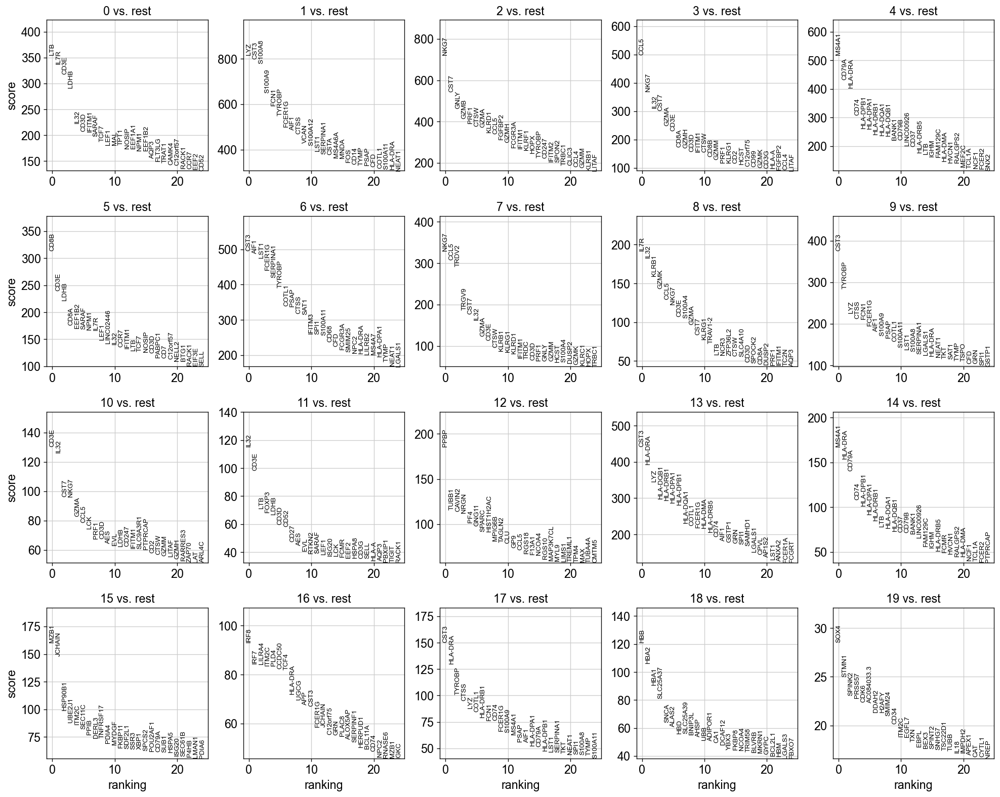

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,LTB,LYZ,NKG7,CCL5,MS4A1,CD8B,CST3,NKG7,IL7R,CST3,CD3E,IL32,PPBP,CST3,MS4A1,MZB1,IRF8,CST3,HBB,SOX4
1,IL7R,CST3,CST7,NKG7,CD79A,CD3E,AIF1,CCL5,IL32,TYROBP,IL32,CD3E,TUBB1,HLA-DRA,HLA-DRA,JCHAIN,IRF7,HLA-DRA,HBA2,STMN1
2,CD3E,S100A8,GNLY,IL32,HLA-DRA,LDHB,LST1,TRDV2,KLRB1,LYZ,CST7,LTB,CAVIN2,LYZ,CD79A,HSP90B1,LILRA4,TYROBP,HBA1,SPINK2
3,LDHB,S100A9,GZMB,CST7,CD74,CD8A,FCER1G,TRGV9,GZMK,CTSS,NKG7,FOXP3,NRGN,HLA-DQB1,CD74,UBE2J1,ITM2C,CTSS,SLC25A37,PRSS57
4,IL32,FCN1,PRF1,GZMA,HLA-DPB1,EEF1B2,SERPINA1,CST7,CCL5,FCN1,GZMA,LDHB,PF4,HLA-DRB1,HLA-DPB1,ITM2C,PLD4,LYZ,SNCA,CDK6


In [8]:
sc.settings.set_figure_params(dpi=60,dpi_save=600)
def pp_findmarkergenes(adata):
    # 下面一行是为了解决 keyErorr: 'base'
    adata.uns['log1p']["base"] = None
    
    sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
    sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, ncols=5)

    # Show the 10 top ranked genes per cluster 0, 1, …, 7 in a dataframe.
    dataframe = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)

    # # Get a table with the scores and groups.
    # result = adata.uns['rank_genes_groups']
    # groups = result['names'].dtype.names
    # dataframe = pd.DataFrame(
    #     {group + '_' + key[:1]: result[key][group]
    #     for group in groups for key in ['names', 'pvals']}).head(5)
    # display(dataframe)
    return dataframe

print(adata)
check_df = pp_findmarkergenes(adata)
check_df.head()

In [9]:
check_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,LTB,LYZ,NKG7,CCL5,MS4A1,CD8B,CST3,NKG7,IL7R,CST3,CD3E,IL32,PPBP,CST3,MS4A1,MZB1,IRF8,CST3,HBB,SOX4
1,IL7R,CST3,CST7,NKG7,CD79A,CD3E,AIF1,CCL5,IL32,TYROBP,IL32,CD3E,TUBB1,HLA-DRA,HLA-DRA,JCHAIN,IRF7,HLA-DRA,HBA2,STMN1
2,CD3E,S100A8,GNLY,IL32,HLA-DRA,LDHB,LST1,TRDV2,KLRB1,LYZ,CST7,LTB,CAVIN2,LYZ,CD79A,HSP90B1,LILRA4,TYROBP,HBA1,SPINK2
3,LDHB,S100A9,GZMB,CST7,CD74,CD8A,FCER1G,TRGV9,GZMK,CTSS,NKG7,FOXP3,NRGN,HLA-DQB1,CD74,UBE2J1,ITM2C,CTSS,SLC25A37,PRSS57
4,IL32,FCN1,PRF1,GZMA,HLA-DPB1,EEF1B2,SERPINA1,CST7,CCL5,FCN1,GZMA,LDHB,PF4,HLA-DRB1,HLA-DPB1,ITM2C,PLD4,LYZ,SNCA,CDK6
5,CD3D,TYROBP,CTSW,CD3E,HLA-DPA1,SARAF,TYROBP,IL32,NKG7,FCER1G,CCL5,CD3D,GNG11,HLA-DPA1,HLA-DPA1,SEC11C,CCDC50,COTL1,ALAS2,AC084033.3
6,IFITM1,FCER1G,GZMA,CD8A,HLA-DRB1,NPM1,COTL1,GZMA,CD3E,AIF1,LCK,CD52,SPARC,HLA-DPB1,HLA-DRB1,PPIB,TCF4,HLA-DRB1,HBD,DDAH2
7,SARAF,AIF1,KLRD1,GZMH,HLA-DQA1,IL7R,PSAP,CD3E,S100A4,S100A9,PRF1,CD27,HIST1H2AC,HLA-DQA1,LTB,DERL3,HLA-DRA,FCN1,SLC25A39,H2AFY
8,TCF7,CTSS,CCL5,CD3D,HLA-DQB1,LEF1,CTSS,CTSW,GZMA,PSAP,CD3D,AES,MPIG6B,COTL1,HLA-DQA1,TNFRSF17,UGCG,CD74,BNIP3L,SMIM24
9,LEF1,VCAN,FGFBP2,IFITM1,BANK1,LINC02446,SAT1,KLRB1,CST7,COTL1,AES,EVL,TAGLN2,FCER1G,HLA-DQB1,PDIA4,APP,FCER1G,AHSP,CD34


In [10]:
marker_genes_dict = {
    'MNPs': ['FCGR3B', 'CSF3R','CD14', 'LYZ', 'FCGR3A','CD68', 'CD163',],
    'NK cells': ['GNLY', 'NKG7', 'PRF1'],
    'CD4+ T cells': ['CD3D', 'CD3E', 'CD4'],
    'CD8+ T cells': ['CD8A'],
    'γΔ T cells':['TRDV2', 'TRGV9'],
    'Treg cells':['FOXP3'],
    'B cells': ['HLA-DQA1', 'CD79A', 'MS4A1'],
    'Plasma cells': ['IGHA1', 'JCHAIN'],
    'Platelets': ['CLEC1B', 'RGS18', 'RGS10', 'PF4', 'PPBP'],
    'RBC': ['HBA1', 'HBA2']
    
}

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`
categories: 0, 1, 2, etc.
var_group_labels: MNPs, NK cells, CD4+ T cells, etc.


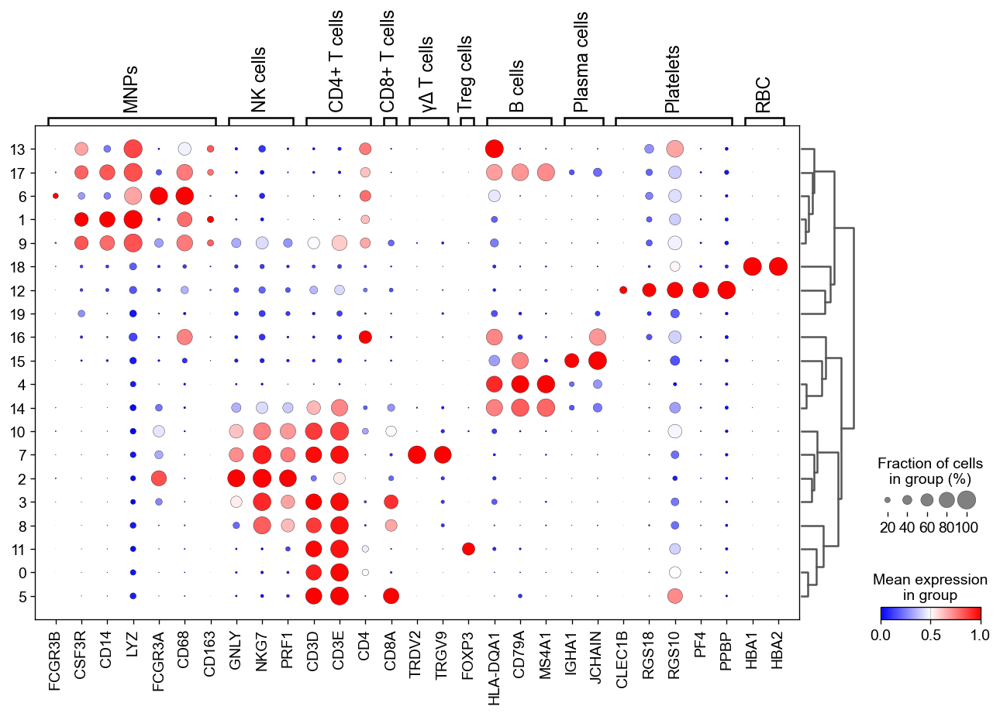

In [11]:
sc.settings.set_figure_params(dpi=60,dpi_save=600)
sc.pl.dotplot(
    adata, groupby="leiden", dendrogram=True,
    swap_axes=False, cmap='bwr', standard_scale='var',
    var_names=marker_genes_dict,save='marker_genes_dict.pdf'
)

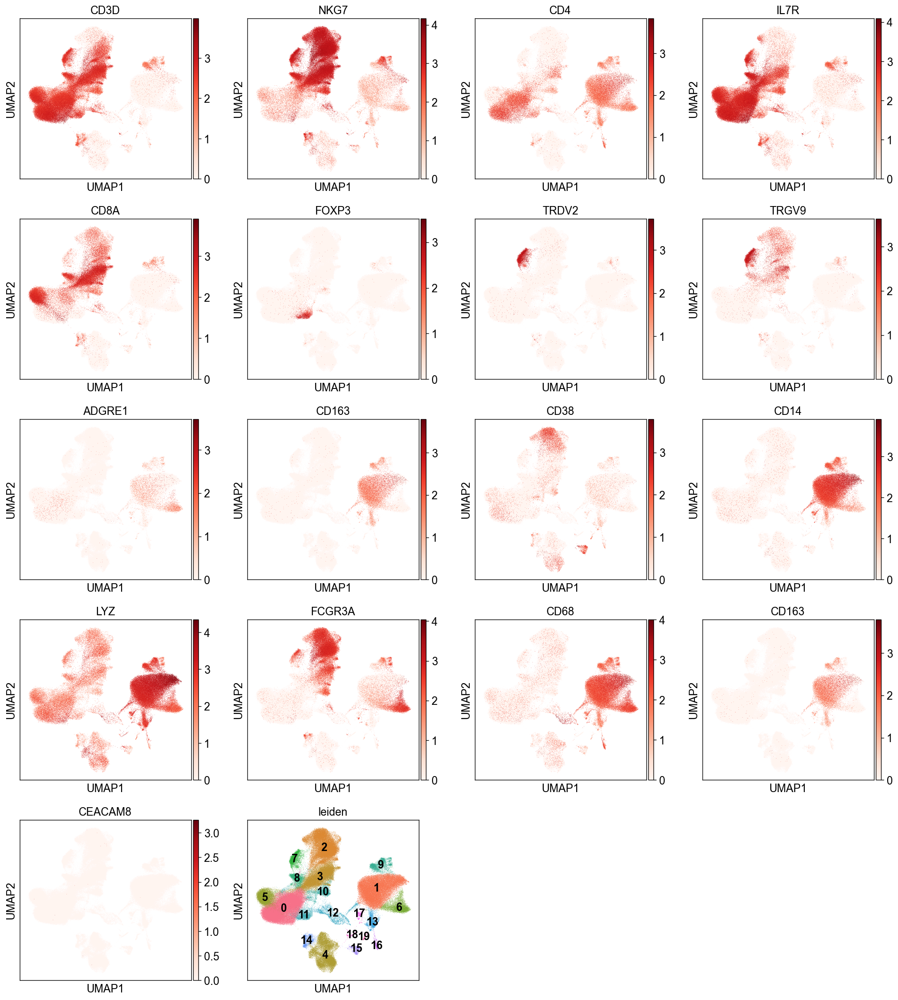

In [44]:
sc.settings.set_figure_params(dpi=60,dpi_save=600)
sc.pl.umap(
    adata, 
    color=['CD3D', 'NKG7', 'CD4', 'IL7R', 'CD8A', 'FOXP3', 'TRDV2', 
           'TRGV9', 'ADGRE1','CD163','CD38', 'CD14', 'LYZ', 'FCGR3A',
        'CD68', 'CD163','CEACAM8','leiden'],
    frameon=True,cmap='Reds' ,ncols=4, legend_loc='on data',save='marker_1.pdf'
)

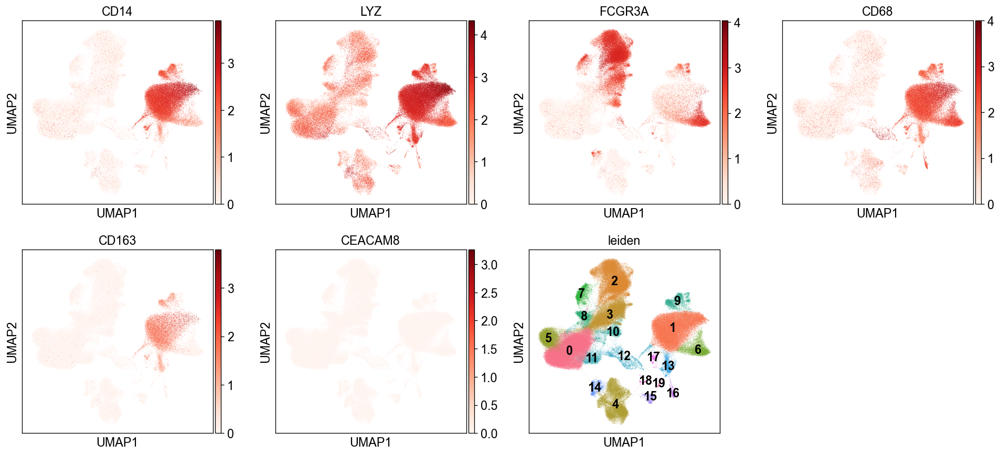

In [45]:
sc.settings.set_figure_params(dpi=60,dpi_save=600)
sc.pl.umap(
    adata, 
    color=[
        'CD14', 'LYZ', 'FCGR3A',
        'CD68', 'CD163','CEACAM8','leiden'
    ],
    frameon=True, ncols=4,cmap='Reds', legend_loc='on data',save='marker_2.pdf'
)

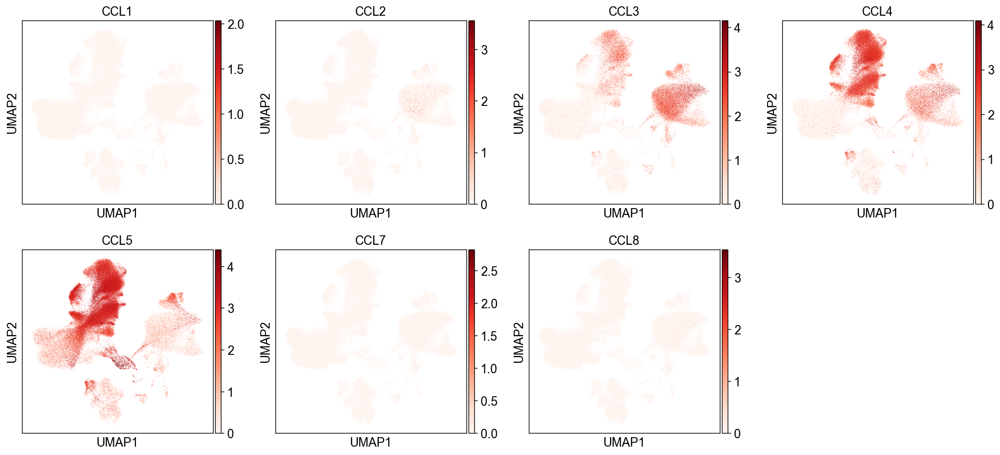

In [46]:
sc.settings.set_figure_params(dpi=60,dpi_save=600)
sc.pl.umap(
    adata, 
    color=[
        'CCL1', 'CCL2','CCL3','CCL4','CCL5','CCL7','CCL8'
        
    ],
    frameon=True, ncols=4,cmap='Reds', legend_loc='on data',save='marker_3'
)

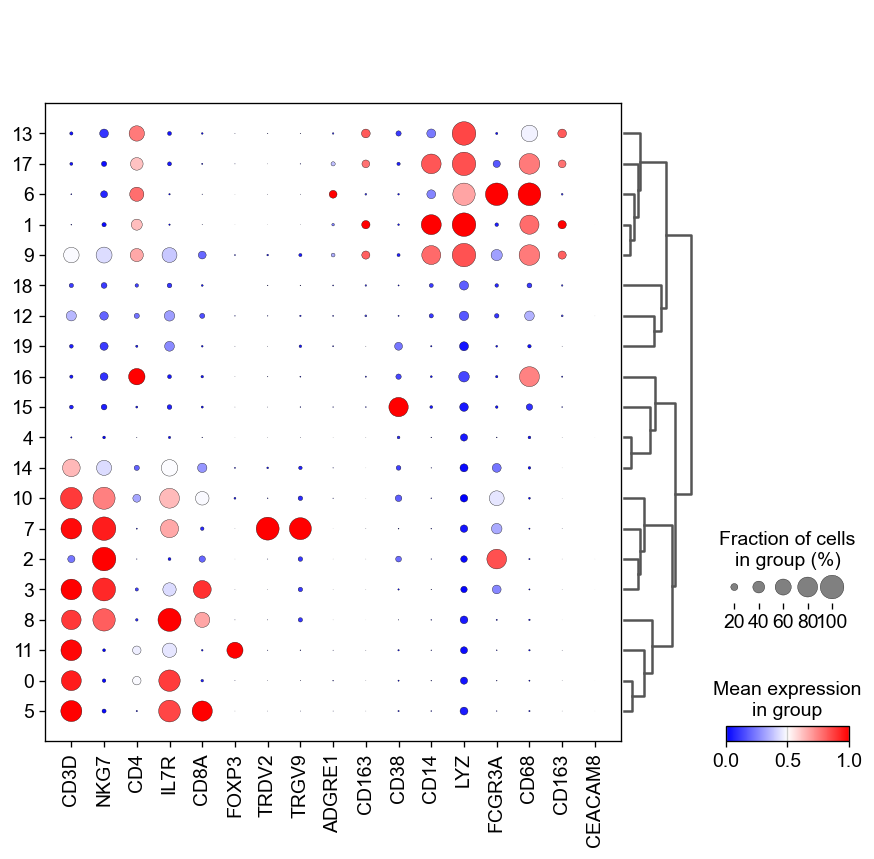

In [47]:
sc.settings.set_figure_params(dpi=60,dpi_save=600)
sc.pl.dotplot(
    adata, groupby="leiden", dendrogram=True,
    swap_axes=False, cmap='bwr', standard_scale='var',
    var_names=[
        'CD3D', 'NKG7', 'CD4', 'IL7R', 'CD8A', 'FOXP3', 'TRDV2', 
           'TRGV9', 'ADGRE1','CD163','CD38', 'CD14', 'LYZ', 'FCGR3A',
        'CD68', 'CD163','CEACAM8'
    ],save='marker_4'
)

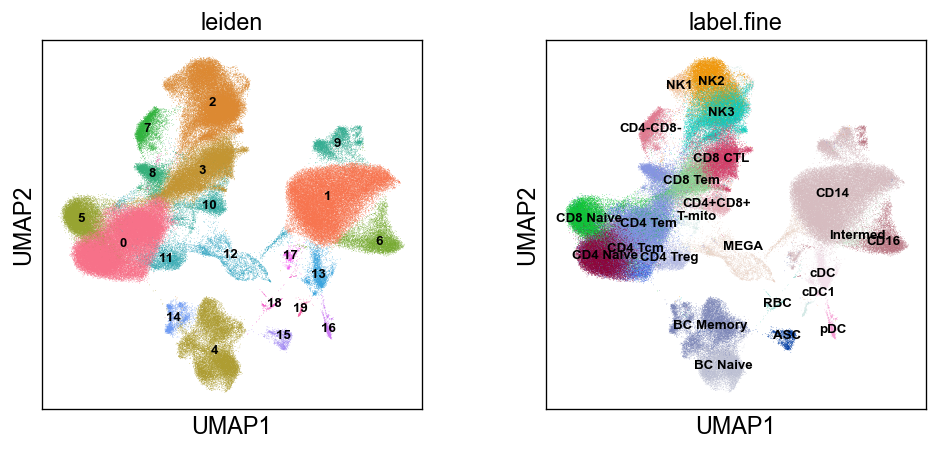

In [12]:
sc.settings.set_figure_params(dpi=60,dpi_save=600)
sc.pl.umap(adata, color=['leiden', 'label.fine'], legend_loc='on data', legend_fontsize=8,save='Leiden_2')

In [13]:
# 中手动注释亚群
adata.obs['cell_type'] = (
    adata.obs['leiden']
    .map(lambda x: {        
        '17': 'MNPs',
        '1': 'MNPs',
        '9': 'MNPs',

        '6': 'MNPs',

        '13': 'MNPs',
        '16': 'CD4+ T cells',
        '19': 'MNPs',

        '12': 'Platelets',
        '18': 'RBCs',

        '2': 'NK cells',

        '3': 'CD8+ T cells',
        '10': 'CD8+ T cells',
        '7': 'γΔ T cells',
        
        '0': 'CD4+ T cells',
        '5': 'CD4+ T cells',

        '11': 'Treg cells',
        '8': 'CD8+ T cells',

        
        '4': 'B cells',
        '14': 'B cells',
        '15': 'Plasma cells',

        }.get(x, x))
    .astype("category")
)
# .cat.set_categories([
#     'Neutrophils', 'MPC', 'NK cells', 'T cells', 'B cells',
#     'Plasma cells', 'Eosinophils', 'Platelets', 'RBCs'
# ])

print(adata.obs['cell_type'])

AAACCTGAGCATGGCA-1             MNPs
AAACCTGAGCGTAGTG-1     CD4+ T cells
AAACCTGAGCTGATAA-1             MNPs
AAACCTGAGGCCCTTG-1             MNPs
AAACCTGAGGGCTCTC-1         NK cells
                           ...     
TTTGTCAGTGCTGTAT-22            MNPs
TTTGTCAGTTACCGAT-22            MNPs
TTTGTCATCCACGCAG-22            MNPs
TTTGTCATCCCAACGG-22    CD8+ T cells
TTTGTCATCGTACGGC-22    CD4+ T cells
Name: cell_type, Length: 203570, dtype: category
Categories (10, object): ['B cells', 'CD4+ T cells', 'CD8+ T cells', 'MNPs', ..., 'Platelets', 'RBCs', 'Treg cells', 'γΔ T cells']


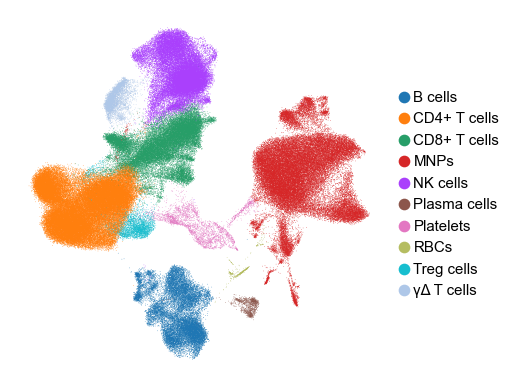

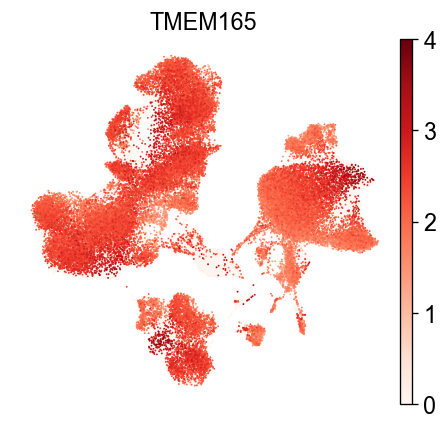

In [53]:
sc.settings.set_figure_params(dpi=60,figsize=(4,4),dpi_save=600)
sc.pl.umap(adata, color=['cell_type'],legend_fontsize='9', title=''
           ,frameon=False,ncols=1,save='celltypist_1.pdf')
vmax_list =  [
    3,3
]
sc.settings.set_figure_params(dpi=60,figsize=(4.5,4),dpi_save=600)
sc.pl.umap(adata, color=['C9ORF72'],vmax='4', ncols=1,size=5,frameon=False,cmap='Reds',save='C9_exp.pdf')

In [14]:
adata.obs['cell_type'].value_counts(normalize=True)

cell_type
CD4+ T cells    0.300855
MNPs            0.241106
NK cells        0.159336
CD8+ T cells    0.145626
B cells         0.093290
γΔ T cells      0.021044
Treg cells      0.015950
Platelets       0.015361
Plasma cells    0.005320
RBCs            0.002112
Name: proportion, dtype: float64

In [55]:
# 暂时保存……？
adata.write('04_anno_temp.h5ad')
adata

AnnData object with n_obs × n_vars = 203570 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'ident_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'rank_genes_groups', 'dendrogram_leiden', 'label.fine_colors', 'cell_type_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

# 5. check

In [8]:
adata = sc.read("04_anno_temp.h5ad")
adata

AnnData object with n_obs × n_vars = 203570 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'ident_colors', 'label.fine_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [16]:
adata_MNPs = adata[adata.obs['cell_type'].str.contains('MNPs')]
adata_MNPs

View of AnnData object with n_obs × n_vars = 49082 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'ident_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'rank_genes_groups', 'dendrogram_leiden', 'label.fine_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [15]:
adata_aging= adata[adata.obs['status'].isin(['YA', 'AA'])]

In [17]:
adata_MNPs_Aging = adata_MNPs[adata_MNPs.obs['status'].isin(['YA', 'AA'])]
adata_MNPs_Aging

View of AnnData object with n_obs × n_vars = 32064 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'ident_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'rank_genes_groups', 'dendrogram_leiden', 'label.fine_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [12]:
adata_MNPs_Aging.obs['status'] =adata_MNPs_Aging.obs['status'].cat.set_categories(['YA', 'AA',])

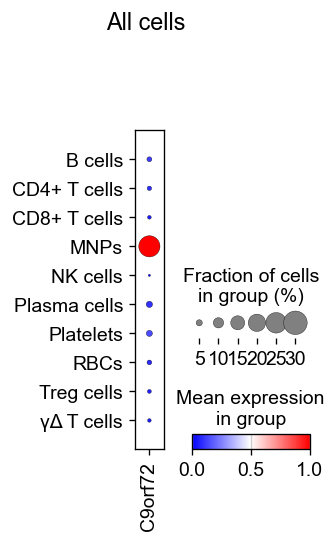

In [18]:
sc.settings.set_figure_params(dpi=60,dpi_save=300)
sc.pl.dotplot(
    adata_aging, groupby="cell_type", 
    swap_axes=False, cmap='bwr', standard_scale='var',
    var_names=[
        'C9orf72'
    ],
    title='All cells ',save='dotplot_SASP_1.pdf'
)

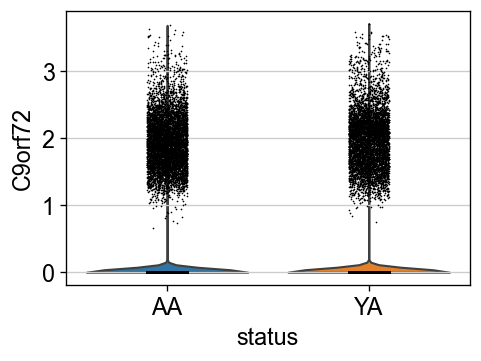

In [72]:
sc.settings.set_figure_params(dpi=60,dpi_save=600)
with rc_context({"figure.figsize": (4.5, 3)}):
    sc.pl.violin(adata_aging, ['C9orf72'], groupby="status",save='_1')

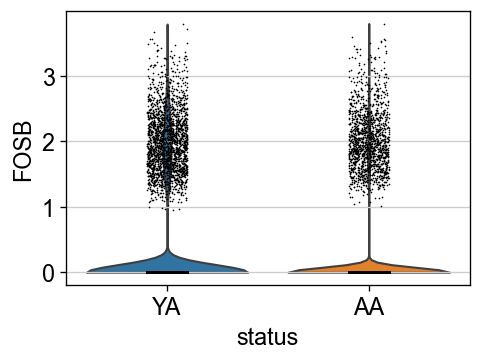

In [113]:
sc.settings.set_figure_params(dpi=60,dpi_save=300)
with rc_context({"figure.figsize": (4.5, 3)}):
    sc.pl.violin(
        adata_aging[adata_aging.obs['cell_type'].str.contains('MNPs')], 
        ['FOSB'], groupby="status",
        stripplot=True,  # remove the internal dots
        inner="box", save='_2' # adds a boxplot inside violins
    )

In [74]:
from matplotlib import rcParams
from matplotlib import colormaps 
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import colormaps 

# 定义colorbar的颜色帧
# color_list = ['#E1E1E1', '#D29080', '#BE402C']
# color_list = ['#E1E1E1', '#FA6849', '#72030F']
# color_list = ['#D1D1D1', '#F4876E', '#FF0000']
color_list = ['#D1D1D1', '#A392DB', '#3E3BE8']

# 线性补帧，并定义自定义colormap的名字，此处为rain
my_cmap = LinearSegmentedColormap.from_list('myred', color_list)

# 注册自定义的cmap，此后可以像使用内置的colormap一样使用自定义的rain
colormaps.register(cmap=my_cmap)

In [76]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

def split_umap(adata, split_by, ncol=4, nrow=None, **kwargs):
    categories = adata.obs[split_by].cat.categories
    if nrow is None:
        nrow = int(np.ceil(len(categories) / ncol))
    fig, axs = plt.subplots(nrow, ncol, figsize=(4*ncol, 4*nrow))
    axs = axs.flatten()
    for i, cat in enumerate(categories):
        ax = axs[i]
        sc.pl.umap(adata[adata.obs[split_by] == cat],
                   ax=ax, show=False, title=cat, **kwargs)
    plt.tight_layout()

In [144]:
#算某个基因集合的综合评分
sc.tl.score_genes(
    adata_sub, gene_list=[
    'CDKN1A', 'CDKN2A', 'CDKN1B', 
    'IL1B', 'IL6','IL12A', 'CXCL6', 'CXCL1', 'CXCL3', 'CXCL8', 'CXCL16','IRF7', 'CCL5' ,
    'TNF', 'TGFB1','ICAM1','VEGFA'
],
    score_name='SASP'
)

computing score 'SASP'
    finished: added
    'SASP', score of gene set (adata.obs).
    550 total control genes are used. (0:00:26)


In [19]:
#定义基因群，方便热图或者其他类型的图的展示
SASP_genes = [
    'CDKN1A', 'CDKN2A', 'CDKN1B', 
    'IL1B', 'IL6','IL12A', 'CXCL6', 'CXCL1', 'CXCL3', 'CXCL8', 'CXCL16','IRF7', 'CCL5' ,
    'TNF', 'TGFB1','ICAM1','VEGFA'
]

In [78]:
def split_umap(adata, split_by, color, ncol=2, nrow=None, **kwargs):
    categories = adata.obs[split_by].cat.categories
    if nrow is None:
        nrow = int(np.ceil(len(categories) / ncol))
    fig, axs = plt.subplots(nrow, ncol, figsize=(4*ncol, 4*nrow)) # 注意这里更改了散点图的 长宽比
    axs = axs.flatten()
    for i, cat in enumerate(categories):
        ax = axs[i]
        ax = sc.pl.umap(
            adata[adata.obs[split_by] == cat], ax=ax, color = color, show=False, 
            # title=color+' in '+cat, 
            # title = " ",
            **kwargs)
        # ax.set_title(color+' in '+cat, style="italic")
        ax.set_title('$\it{%s}$ in %s'%(color, cat), fontsize=14)
    # plt.text(1.1,0.5,"row title", size=12, verticalalignment='center', rotation=270)
    # plt.title('plttitle')
    plt.tight_layout()
    
    


In [79]:
adata.obs['status'] =adata.obs['status'].cat.set_categories(['YA', 'AA','YCR','ACR'])

In [76]:
adata_COVID19=adata[adata.obs['status'].isin(['YCR','ACR'])]
adata_COVID19

View of AnnData object with n_obs × n_vars = 37607 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type', 'SASP'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'ident_colors', 'label.fine_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [245]:
adata_COVID19_MNPs=adata_MNPs[adata_MNPs.obs['status'].isin(['YCR','ACR'])]
adata_COVID19_MNPs

View of AnnData object with n_obs × n_vars = 17082 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type', 'SASP', 'leiden_MNPs', 'CellID'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'ident_colors', 'label.fine_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'leiden_MNPs', 'dendrogram_leiden_MNPs', 'leiden_MNPs_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [78]:
adata_COVID19_MNPs.obs['status'] =adata_COVID19_MNPs.obs['status'].cat.set_categories(['YCR', 'ACR',])

In [969]:
#定义基因群，方便热图或者其他类型的图的展示
#Lysosome_genes = [
#   'PPT1', 'PPT2', 'AP3B1', 'AP3M2','AP3D1','AP1S2' ,'AP4B1', 'AP4S1', 'AP1G1', 'AP4E1','AP1G2','AP4M1', 'AP3S1',
#    'AP1B1', 'LGMN', 'PLA2G15', 
#   'ABCA2', 'GALNS','CTSC', 'ENTPD4', 'HGSNAT' ,
#    'MANBA', 'HEXA','NEU1', 'MAN2B1', 'CD68', 
#    'MCOLN1', 'HYAL1', 'GNPTAB', 'CLN3', 'CLN5','CTSZ' ,
#    'GGA2','FUCA1', 'GNPTG','GGA3','GLA', 'M6PR', 'NAGLU', 
#   'SLC11A2', 'NAPSA','GBA', 'NAGPA', 'CTSH','CLTB', 'AGA' , 'GALC','SGSH','IGF2R','SUMF1','GUSB'
#    , 'ARSG' ,'ABCB9', 'CLTA','GLB1', 'GGA1' ,
#    'SLC11A1', 'CTSK','MFSD8','ATP6V0D2', 'ATP6V0A1','ATP6V0D1', 'ATP6V0A2','ATP6AP1','ATP6V0C', 'ATP6V1H'
#]

In [1163]:
mTOR_regulators_genes =[
'LAMTOR1','LAMTOR2','LAMTOR3','LAMTOR4','LAMTOR5','FLCN','FNIP1','FNIP2','MIOS','SEH1L',
'WDR24','WDR59','SEC13','RHEB','NPC1','SLC38A9','NPC2','BTRC','SESN2','SESN1','SESN3',
'PPP2CA','RRAGA','RRAGC','RRAGD','RRAGB','TSC2','TSC1','BMT2','NPRL2','NPRL3','DEPDC5','KPTN','ITFG2','C12orf66','SZT2','CASTOR1','CASTOR2',
'LGALS8','ATP6V0E1','ATP6V1D','ATP6V1G3','ATP6V1C2','ATP6V1B2','ATP6V0A1',
'ATP6V1G2','ATP6V1E2','ATP6V0A4','ATP6V1E1','ATP6V0B','TCIRG1','ATP6AP2',
'ATP6V1A','ATP6AP1','ATP6V1G1','ATP6V0E2',
'ATP6V0C','ATP6AP1L','ATP6V1H','ATP6V0A2','ATP6V1C1','ATP6V1F','ATP6V0D1',
]

In [1164]:
mTOR_complex_genes =[
   ' MTOR','DEPTOR','RPTOR', 'AKT1S1', 'MLST8' ,'RICTOR', 'PRR5' ,
    'MAPKAP1' ,'TELO2' ,'TTI1','TTI2','PRR5L'
    ]

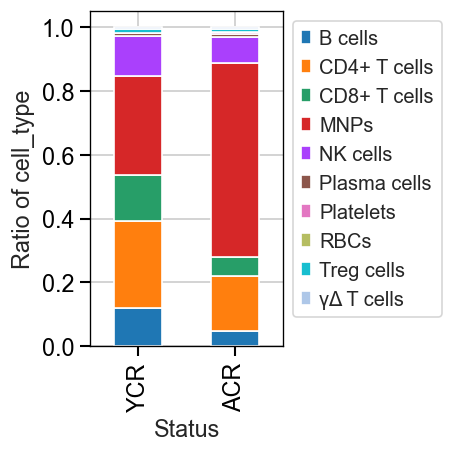

In [385]:
sc.settings.set_figure_params(dpi=60,dpi_save=600)
pd.crosstab(
    adata_COVID19.obs['status'], adata_COVID19.obs['cell_type'],
    normalize='index').plot(kind='bar', xlabel='Status',ylabel='Ratio of cell_type'
    , stacked=True,figsize=(4,4)
,).legend(bbox_to_anchor=(1,1),prop = {'size':12})
plt.savefig(r"figure.pdf",bbox_inches = 'tight')




In [282]:
#定义基因群，方便热图或者其他类型的图的展示
Lysosome_genes = [
   'ADRB2',	'ANKRD27',	'AP3M1'	,'ARSB',	'AZU1',	'BCL10'	,'CD63',	'CLN5'	,
   'CORO1A',	'CTNS',	'CTSC','CTSF'	,'CXCR2'	,'DNASE2',	
   'GALC'	,'GLA'	,'HLA-DOB',	'HLA-DRA'	,'HPS1',	'HPS4'	,'HYAL2',	
   'IFI30'	,'KCNE1'	,'KCNE2',	'KNL1',	'LAMP2'	,'LAMP3'	,'LIPA'	,
   'MPO',	'MYO7A',	'NAGLU'	,'NEU4'	,'NPC2'	,'PPT1'	,'RAB14',	'RAB7A',	
   'RAB9A',	'RAMP2',	'RAMP3',	'SFTPD',	'SLC17A5',	'SPACA3'	,'SRGN'	,
   'STS'	,'TIAL1'	,'TOM1'	,'TOM1L1',	'TPP1',	'TRIM23'	,	'USE1',	'USP4'	,'USP5'	,'USP6'	,'VAMP4',	'VPS45'
]

In [970]:
#定义基因群，方便热图或者其他类型的图的展示
Proteasome_genes = [
   'PSMA4', 'PSMA7', 'PSMC3', 'PSMC4','PSMB2','PSMA5' ,'PSMC1', 'PSMC6', 'SEM1',
   'PSMA6', 'PSMD14', 'PSMB6', 'PSMB1','PSME1','PSMA2' ,'POMP', 'PSMB5', 'PSMB7',
   'PSMD7', 'PSMC5', 'PSME2', 'PSMA1','PSMD4','PSMD13' ,'PSMB3', 'PSMD2', 'PSMD6',
   'PSMA3', 'PSMC2', 'PSMD11', 'PSMB9','PSMD12','PSMD1' ,'PSMF1', 'PSMB4', 'IFNG',
   'PSME3', 'PSMD8', 'PSME4', 'PSMB8','PSMD3','PSMB11' ,'PSMB10']

In [993]:
Chaperones_genes=[
   'DNAJA1','DNAJC9','DNAJC2','DNAJB14' , 'DNAJB9','DNAJC3', 'DNAJC19','DNAJC17','DNAJC11' 
   , 'DNAJC7', 'DNAJB1', 'DNAJC4', 'DNAJC1', 'DNAJC18','DNAJB4','DNAJB11','DNAJC30', 'DNAJA3', 'DNAJB2'
   , 'DNAJC28', 'DNAJC12', 'DNAJA4', 'DNAJC15', 'DNAJC5','DNAJB12','DNAJA2', 'DNAJC14', 'DNAJC25'
   ,'DNAJB13', 'DNAJC6','DNAJB6', 'DNAJB5', 'DNLZ','CLU', 'NPM1', 'HSP90AA1'
   , 'HSP90AB1','PPIH'  ,'CCT7', 'CCT3', 'HSPA2'
   , 'HSPD1', 'SCG5', 'PFDN6','FKBP4','CCT8' ,'PARK7', 'PFDN1', 'TCP1'
   , 'TIMM10', 'FKBP5', 'HSPA8','PFDN2' ,'GRPEL1', 'CCT6A', 'PFDN5'
   , 'HSPA14','CCT2' ,'CDC37L1', 'CDC37', 'PSMG1'
   , 'AHSA1', 'HSPA4L','BAG1','PPID' ,'VBP1', 'TSACC'
   , 'CCT6B', 'PDIA6','TIMM9', 'CANX'
   , 'MKKS', 'GRPEL2','HSPA9' , 'MESD', 'TRAP1'
   , 'CLPX', 'TOR1B','UNC45B', 'ERP44'
   , 'ST13', 'HSCB','SERPINH1','CCT4', 'NPLOC4'
   , 'DAXX', 'PDRG1', 'CALR','BAG2' ,'CHORDC1'
   , 'TOMM34','P4HB','HSPA1B' , 'BAG6', 'TBCD'
   , 'BAG3','HSP90B1','CALR3' , 'UNC45A'
   , 'CLGN','TBCE','PDCL' , 'BAG4', 'TOR1A','BAG5'
]

In [324]:
#定义基因群，方便热图或者其他类型的图的展示
Free_genes1 = [
   'MAPK8',	'MCOLN3',	'DRAM1'	,'HDAC1',	'HDAC2','DAPK1',	'DAPK2','DAPK3'
   ,'CAST','PDCD6IP','PICALM','SMURF1','SCOC','WAC','MYO6','PIM2','DYNLL1'
   ,'TMEM59','EI24','MTDH','SUPT20H','BAG3'
   ,'TM9SF1','ZFYVE1','SNAP29','PXN','TGM2','STUB1',
   'PMAIP1','PCM1','RAB3GAP1','RAB18'
]

In [972]:
#定义小细胞群，以anadata格式存储
adata_pla

View of AnnData object with n_obs × n_vars = 1083 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type', 'SASP', 'CXCL', 'SASP_new'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dendrogram_leiden', 'hvg', 'ident_colors', 'label.fine_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'celltype_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

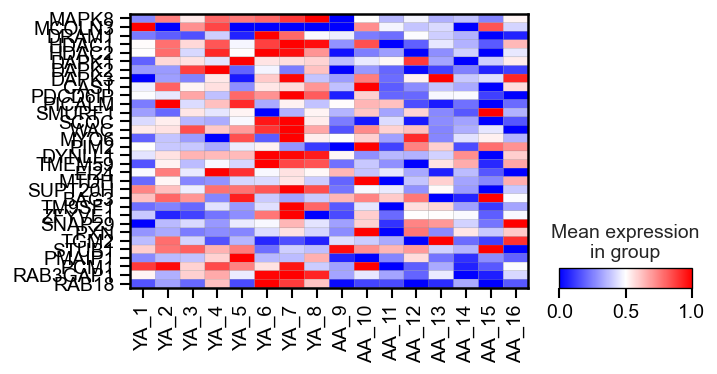

In [379]:
#热图制作
sc.settings.set_figure_params(dpi=60,dpi_save=300)
sc.pl.matrixplot(
    adata_MNPs[adata_MNPs.obs['status'].isin(['YA', 'AA'])], 
    groupby=['status','ident'], 
    swap_axes=True, cmap='bwr', 
    standard_scale='var',figsize=(6,3),
    var_names=[
       
    ] +Free_genes1,
    title='',save='Positive_regulator_autophagy_2.pdf'
)

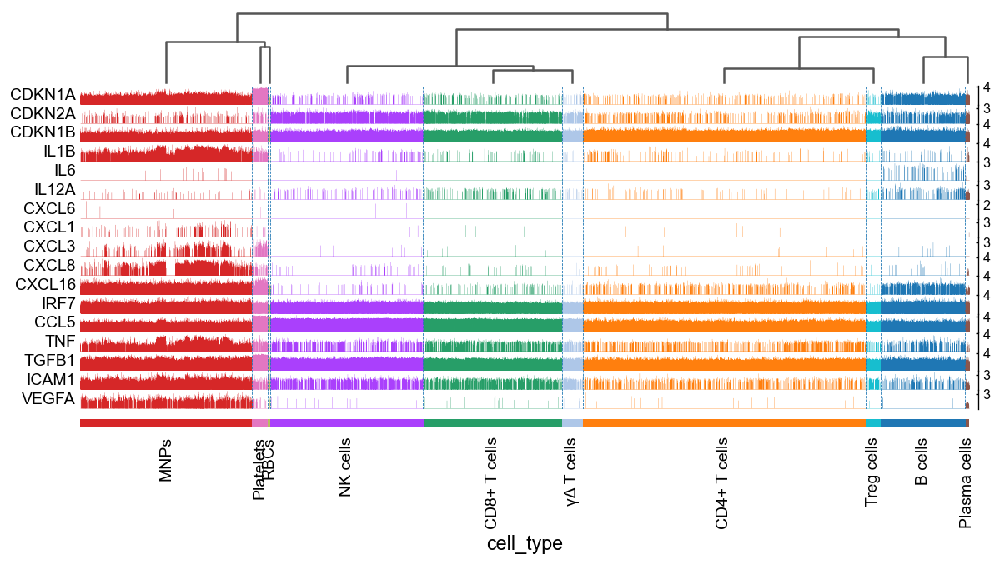

In [23]:
# 绘制 tracksplot
ax = sc.pl.tracksplot(adata_aging, SASP_genes, groupby="cell_type", dendrogram=True, show=False)

# 保存图像，设置 dpi=600
plt.savefig('tracksplot.png', dpi=600, bbox_inches='tight')
plt.show()

In [691]:
#分组 这里把Aging组和新冠组区分开
adata_COVID19_1=adata[adata.obs['status'].isin(['YCR'])]
adata_COVID19_1


View of AnnData object with n_obs × n_vars = 19515 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type', 'SASP', 'CXCL', 'SASP_new'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'ident_colors', 'label.fine_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'celltype_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [692]:
adata_COVID19_2=adata[adata.obs['status'].isin(['ACR'])]
adata_COVID19_2

View of AnnData object with n_obs × n_vars = 18092 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type', 'SASP', 'CXCL', 'SASP_new'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'ident_colors', 'label.fine_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'celltype_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [697]:
adata_COVID19.obs['status'] =adata_COVID19.obs['status'].cat.set_categories(['YCR', 'ACR',])

In [80]:
adata_aging.obs['status'] =adata_aging.obs['status'].cat.set_categories(['YA', 'AA'])

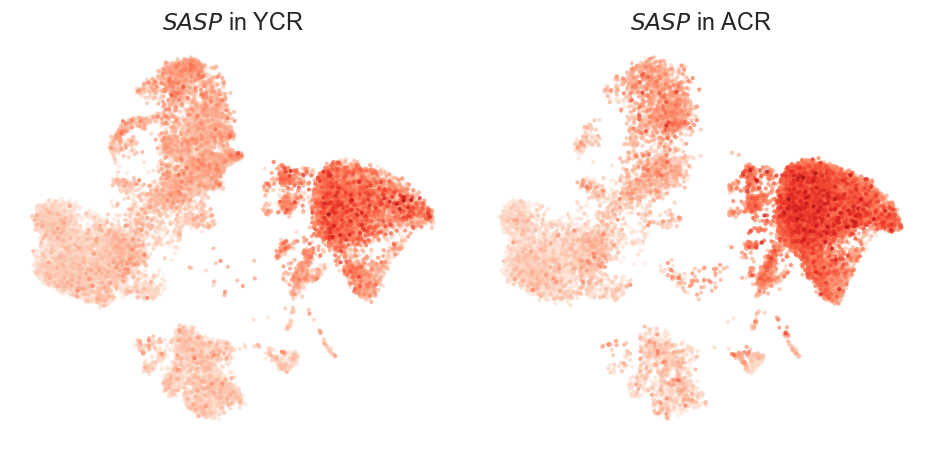

In [234]:
genes_list = [
    'SASP'
]
vmax_list =  [
    1.25, 4
]

sc.settings.set_figure_params(dpi=60)
for i in range(len(genes_list)):
    split_umap(
        adata_COVID19, 
        split_by='status', color=genes_list[i], 
        vmax=vmax_list[i], 
        colorbar_loc=None, # 不显示颜色条，在ppt中自己画一个示意
        ncol=2, 
        alpha=.8, 
        size=25,
        frameon=False, 
        cmap='Reds'
    )
plt.savefig("umapSASP_COVID19_all.pdf",dpi=600)

In [688]:
adata_Aging_1

View of AnnData object with n_obs × n_vars = 78751 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type', 'SASP', 'CXCL', 'SASP_new'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'ident_colors', 'label.fine_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'celltype_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [693]:
adata_COVID19_1.obs["cell_type"] = adata_COVID19_1.obs["cell_type"].astype("category")
adata_COVID19_1.obs["cell_type"].value_counts(normalize=True)

cell_type
CD4+ T cells    0.272695
CD14+ Mono      0.233021
CD8+ T cells    0.135168
NK cells        0.124558
B cells         0.121431
cDC             0.043160
CD16+ Mono      0.032805
γΔ T cells      0.012917
Treg cells      0.010610
Plasma cells    0.009842
pDC             0.002768
Platelets       0.000923
RBCs            0.000103
Name: proportion, dtype: float64

In [694]:
adata_COVID19_2.obs["cell_type"] = adata_COVID19_2.obs["cell_type"].astype("category")
adata_COVID19_2.obs["cell_type"].value_counts(normalize=True)

cell_type
CD14+ Mono      0.472770
CD4+ T cells    0.174711
NK cells        0.081108
CD16+ Mono      0.079283
CD8+ T cells    0.061536
cDC             0.051197
B cells         0.047050
Plasma cells    0.009565
Treg cells      0.008183
Platelets       0.005252
pDC             0.004921
γΔ T cells      0.004257
RBCs            0.000166
Name: proportion, dtype: float64

In [55]:
sc.tl.score_genes(
    adata, gene_list=[
          'CDKN1A', 'CDKN2A', 'IRF7','IGFBP7','CXCL1', 'CXCL2', 'CXCL6', 'CXCL8',
    'TNF', 'MMP1',
    'CCL3' , 'CCL4' ,'ICAM1', 'VEGFA','IL1B', 'IL6','IL23A', 'IL27','TGFB1'
],
    score_name='SASP'
)

computing score 'SASP'
    finished: added
    'SASP', score of gene set (adata.obs).
    650 total control genes are used. (0:00:03)


In [987]:
adata_MNPs_Aging

AnnData object with n_obs × n_vars = 32509 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type', 'SASP', 'leiden_MNPs', 'CellID'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'ident_colors', 'label.fine_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'leiden_MNPs', 'leiden_MNPs_colors', 'dendrogram_leiden_MNPs'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

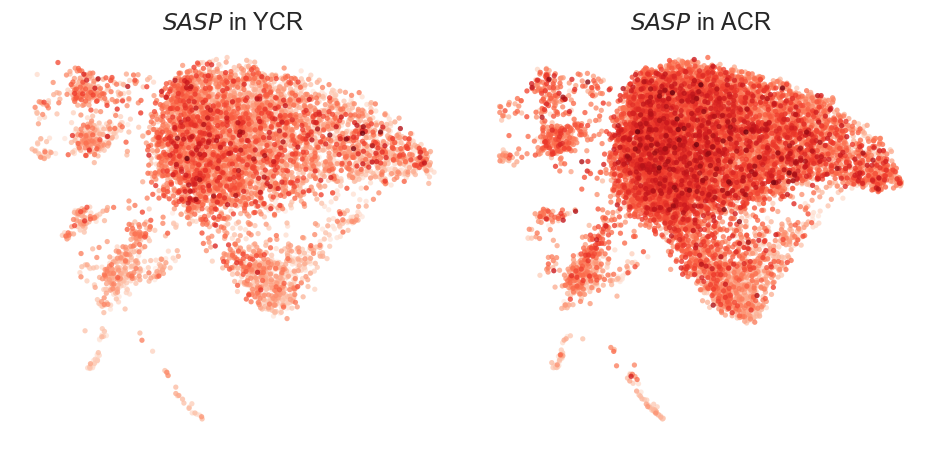

In [246]:
genes_list = [
     'SASP'
]
vmax_list =  [
    1, 2
]

sc.settings.set_figure_params(dpi=60)
for i in range(len(genes_list)):
    split_umap(
        adata_COVID19_MNPs,
        split_by='status',color=genes_list[i], 
        vmax=vmax_list[i], 
        colorbar_loc=None, # 不显示颜色条，在ppt中自己画一个示意
        ncol=2, 
        alpha=.8, 
        size=40,
        frameon=False, 
        cmap='Reds'
    )
plt.savefig("umapSASP_COVID19_MNPs.pdf",dpi=600)

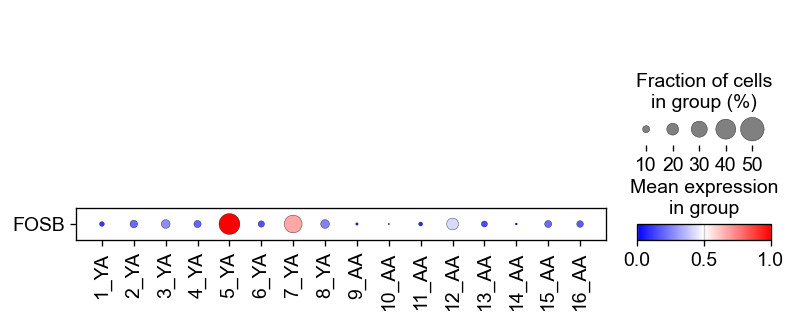

In [108]:
sc.settings.set_figure_params(dpi=60,dpi_save=600)
sc.pl.dotplot(
    adata_MNPs_Aging, 
    groupby=['ident','status'], 
    swap_axes=True, cmap='bwr', standard_scale='var',
    var_names=[
        'FOSB'
    ],
    save='C9_exp_MNPs_1'
)


In [31]:
SASP_genes = [
     'CDKN1A', 'CDKN2A', 'CDKN1B',  'IRF7' ,
    'IL1B', 'IL6','IL12A', 'CXCL6', 'CXCL1', 'CXCL3', 'CXCL8', 'CXCL16',
    'TNF','ICAM1','VEGFA', 'TGFB1','CCL5'
]

In [38]:
sc.tl.score_genes(
    adata_MNPs_Aging, gene_list= SASP_genes,
    score_name='SASP'
)

computing score 'SASP'
    finished: added
    'SASP', score of gene set (adata.obs).
    599 total control genes are used. (0:00:00)


In [54]:
SASP_genes = [
       'CDKN1A', 'CDKN2A', 'IRF7','IGFBP7','CXCL1', 'CXCL2', 'CXCL6', 'CXCL8',
    'TNF', 'MMP1',
    'CCL3' , 'CCL4' ,'ICAM1', 'VEGFA','IL1B', 'IL6','IL23A', 'IL27','TGFB1'
       
]

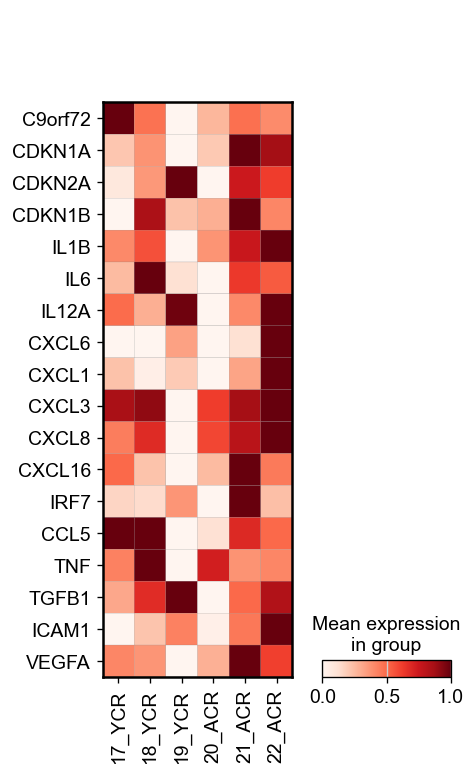

In [101]:
#热图制作
sc.settings.set_figure_params(dpi=60)
sc.pl.matrixplot(
    adata_MNPs[adata_MNPs.obs['status'].isin(['YCR', 'ACR'])], 
    groupby=['ident','status'], 
    swap_axes=True, cmap='Reds', 
    standard_scale='var',
    var_names=['C9orf72'
    ] + SASP_genes,
    title=''
)

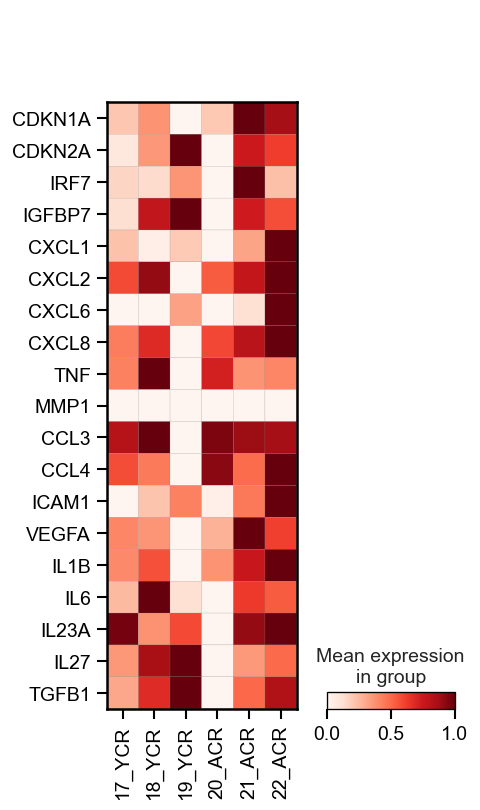

In [276]:
sc.settings.set_figure_params(dpi=60,dpi_save=300)
sc.pl.matrixplot(
    adata_COVID19_MNPs[adata_COVID19_MNPs.obs['status'].isin(['YCR','ACR'])], 
    groupby=['ident','status'], 
    swap_axes=True, cmap='Reds', 
    standard_scale='var',
    var_names=[
      
    ] + SASP_genes,
    title='',save='SASP_COVID19_2.pdf'
    
   
)

In [174]:
# 总之暂时保存一下
adata.write('05_temp_check.h5ad')
adata

AnnData object with n_obs × n_vars = 49591 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type', 'SASP', 'SASP_new', 'leiden_MNPs', 'CellID'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltype_colors', 'dendrogram_leiden', 'dendrogram_leiden_MNPs', 'hvg', 'ident_colors', 'label.fine_colors', 'leiden', 'leiden_MNPs', 'leiden_MNPs_colors', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'status_colors', 'total_celltype_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities

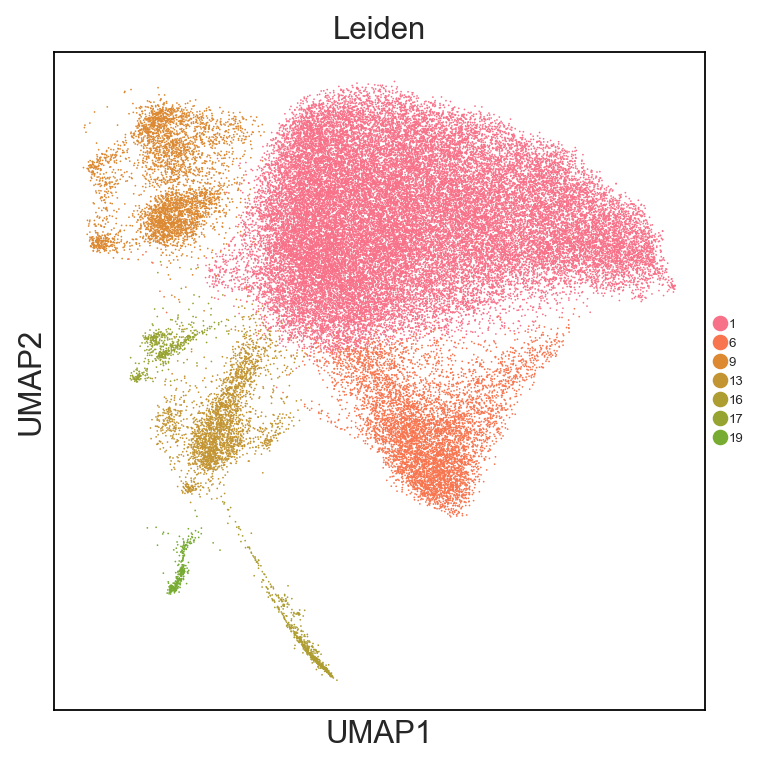

In [280]:
leiden_umap = sc.pl.umap(adata_MNPs, color=['leiden'],
    show=False, palette=sns.color_palette("husl", 20),
legend_fontsize=6, frameon=True, title='Leiden')

lgd = one_col_lgd(leiden_umap)

fig = leiden_umap.get_figure()
fig.set_size_inches(5, 5)
fig.savefig(str(sc.settings.figdir) + '/umap_lgd_leiden',
    dpi=400, bbox_extra_artists=(lgd,), bbox_inches='tight')

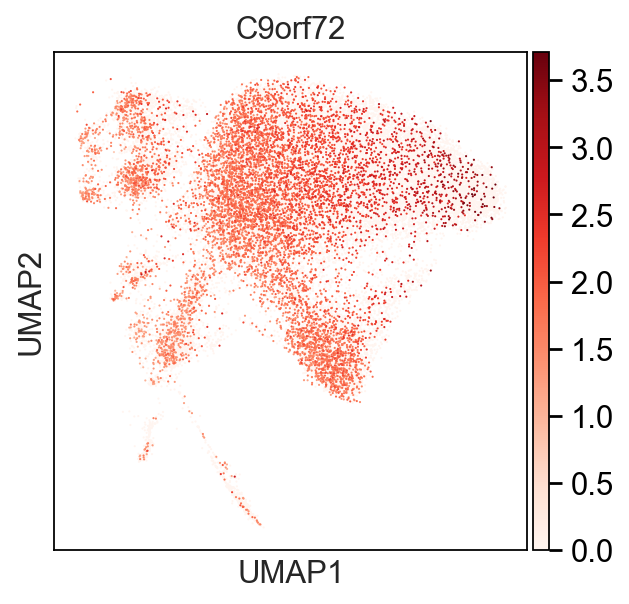

In [337]:
sc.pl.umap(
    adata_MNPs_Aging, 
    color=[
        'C9orf72'
    ],
    frameon=True, ncols=4, cmap='Reds',legend_loc='on data'
)

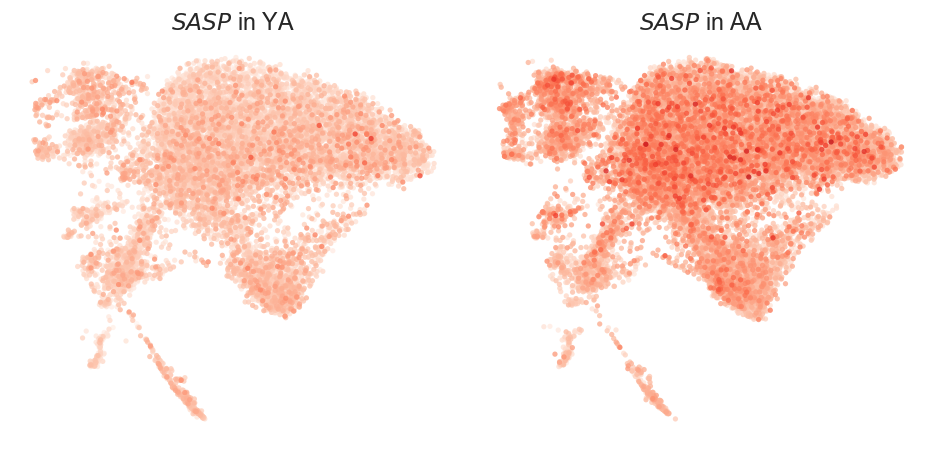

In [1283]:
genes_list = [
    'SASP'
]
vmax_list =  [
    1.5, 4, 1
]

sc.settings.set_figure_params(dpi=60,figsize=(4.5,4))
for i in range(len(genes_list)):
    split_umap(
        adata_MNPs_Aging, 
        split_by='status',color=genes_list[i], 

        vmax=vmax_list[i], 
        colorbar_loc=None, # 不显示颜色条，在ppt中自己画一个示意
        ncol=2, 
        alpha=.8, 
        size=40,
        frameon=False, 
        cmap='Reds'
        

    )

In [45]:
#定义小细胞群，以anadata格式存储
adata_MNPs=adata[adata.obs['cell_type'].str.contains('MNPs')]
adata_MNPs

View of AnnData object with n_obs × n_vars = 49082 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'ident_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'rank_genes_groups', 'dendrogram_cell_type', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

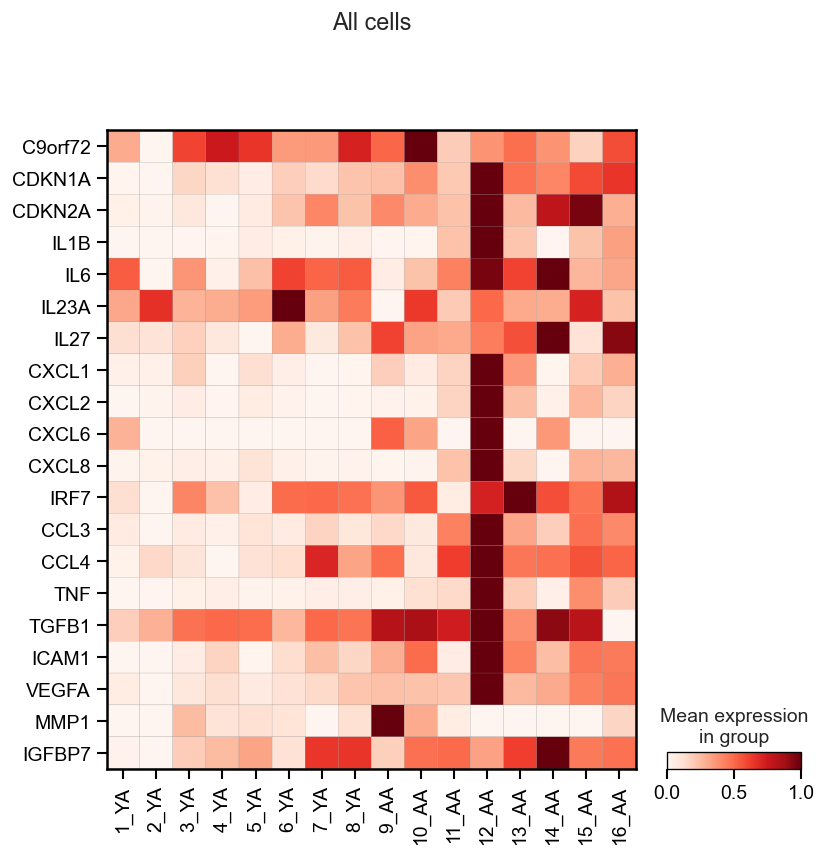

In [975]:
sc.settings.set_figure_params(dpi=60)
sc.pl.matrixplot(
    adata[adata.obs['status'].isin(['YA', 'AA'])], 
    groupby=['ident','status'], 
    swap_axes=True, cmap='Reds', 
    standard_scale='var',
    var_names=['C9orf72'
      
    ]+SASP_genes,title='All cells'
   
    
   
)

NK数据已隐藏

In [186]:
adata

AnnData object with n_obs × n_vars = 49591 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type', 'SASP', 'SASP_new', 'leiden_MNPs', 'CellID'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltype_colors', 'dendrogram_leiden', 'dendrogram_leiden_MNPs', 'hvg', 'ident_colors', 'label.fine_colors', 'leiden', 'leiden_MNPs', 'leiden_MNPs_colors', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'status_colors', 'total_celltype_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities

In [143]:
SASP2_genes = [
    'CDKN1A', 'CDKN2A', 'CDKN1B', 'CDKN2B',
    'IL1B','CXCL10', 'OAS1',  
    'RSAD2', 'TNF', 'TGFB1','ICAM1','CCL5','VEGFA'
]

In [ ]:
sc.settings.set_figure_params(dpi=80)
sc.pl.matrixplot(
    adata_nk[adata_nk.obs['status'].isin(['YA', 'AA'])], 
    groupby=['ident','status'], 
    swap_axes=True, cmap='bwr', 
    standard_scale='var',
    var_names=['C9orf72'
      
    ]+SASP_genes,
    title='NK cells',
    
   
)

In [43]:
#分组 这里把Aging组和新冠组区分开
adata_aging = adata[adata.obs['status'].isin(['YA', 'AA'])]
adata_aging

View of AnnData object with n_obs × n_vars = 165963 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'ident_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'rank_genes_groups', 'dendrogram_cell_type', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [135]:
adata_covid19 = adata[adata.obs['status'].isin(['YCR', 'ACR'])]
adata_covid19

View of AnnData object with n_obs × n_vars = 37607 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type', 'SASP', 'SASP_new'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'ident_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'rank_genes_groups', 'dendrogram_leiden', 'label.fine_colors', 'cell_type_colors', 'celltype_colors', 'total_celltype_colors', 'status_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [499]:
adata_id1 = adata[adata.obs['ident'].isin(['6','2','3','4','5','11','12','13','15','16'])]
adata_id1

View of AnnData object with n_obs × n_vars = 108600 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type', 'SASP', 'SASP_new', 'CellID', 'leiden_MNPs'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'ident_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'rank_genes_groups', 'dendrogram_leiden', 'label.fine_colors', 'celltype_colors', 'total_celltype_colors', 'status_colors', 'cell_type_colors', 'leiden_MNPs'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [ ]:
genes_list = [
     'SASP','C9orf72'
]
vmax_list =  [
    2, 6, 1
]
sc.settings.set_figure_params(dpi=80)
for i in range(len(genes_list)):
    split_umap(
        adata_id1, 
        split_by='status',color=genes_list[i], 

        vmax=vmax_list[i], 
        # colorbar_loc=None, # 不显示颜色条，在ppt中自己画一个示意
        ncol=4, 
        alpha=.8, 
        size=15,
        frameon=False, 
        cmap='Reds'
    )

In [46]:
adata_MNPs_Aging = adata_MNPs[adata_MNPs.obs['status'].isin(['YA', 'AA'])]
adata_MNPs_Aging

View of AnnData object with n_obs × n_vars = 32064 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'ident_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'rank_genes_groups', 'dendrogram_cell_type', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [ ]:
sc.settings.set_figure_params(dpi=80)
sc.pl.matrixplot(
    adata_nk2[adata_nk2.obs['status'].isin(['YCR', 'ACR'])], 
    groupby=['ident','status'], 
    swap_axes=True, cmap='bwr', 
    standard_scale='var',
    var_names=['C9orf72'
      
    ]+SASP_genes,
    title='NK',
    
   
)

细分细胞亚群！！！！！

In [ ]:
#M1_Macro_genes = 
    #'CCR7', 'IL7R','FCGR3A', 'FCGR2B',
    #'SELL', 'FCGR1A', 'CD80','CD86', 'CXCL10',  
    #'IL15RA', 'IL17RA', 'IL1R1','IL2RA','TLR2','TLR4' 

In [ ]:
#M2_Macro_genes = 
    #'CD163', 'MRC1','FCER2', 'CD36',
    #'IL1RN', 'CD209','RETN', 'CXCR4', 'TNFSF10','CLEC7A'

In [ ]:
#CD16+ Mono_genens=[
    #'CDKN1C','LRRC25','TCF7L2','LYN','PILRA'
#]

In [ ]:
#cMo_genens=[
  # 'S100A8','S100A9','S100A12','VCAN','CSF3R'
#]

In [ ]:
#cDc1_genens=[
    #'BTLA','CADM1','CD8A','CLEC9A','ITGAE','ITGAX','LY75','THBD','XCR1'
#]

In [ ]:
#cDc2_genens=[
    #'CD14','CD163','CD8A','CLEC10A','NOTCH2','ITGAM','SIRPA','CX3CR1','CD1C','CD2'
#]

In [ ]:
#mo-DC_genens=[
    #'CD14','CD1A','CD1C','CD209','FCER1','ITGAM','MRC1','SIRPA'
#]

running Leiden clustering
    finished: found 13 clusters and added
    'leiden_MNPs', the cluster labels (adata.obs, categorical) (0:00:10)


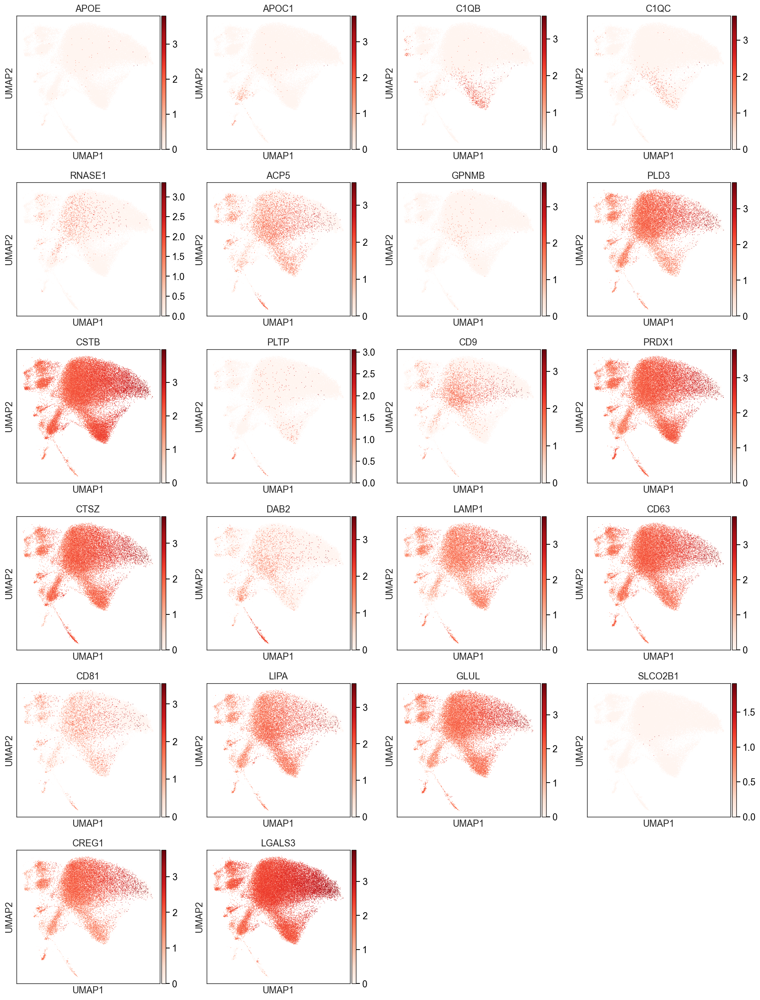

In [279]:
sc.settings.set_figure_params(dpi=60,dpi_save=600)
sc.tl.leiden(adata_MNPs, key_added='leiden_MNPs', resolution=0.7)
sc.pl.umap(
    adata_MNPs,
    color=['APOE', 'APOC1', 'C1QB', 'C1QC',
    'RNASE1', 'ACP5', 'GPNMB','PLD3', 'CSTB',  
    'PLTP', 'CD9', 'PRDX1','CTSZ','DAB2','LAMP1'
    , 'CD63','CD81','LIPA','GLUL', 'SLCO2B1','CREG1','LGALS3'],frameon=True,cmap='Reds',ncols=4,
    save='MNPs_marker_1.pdf'
)


running Leiden clustering
    finished: found 13 clusters and added
    'leiden_MNPs', the cluster labels (adata.obs, categorical) (0:00:10)


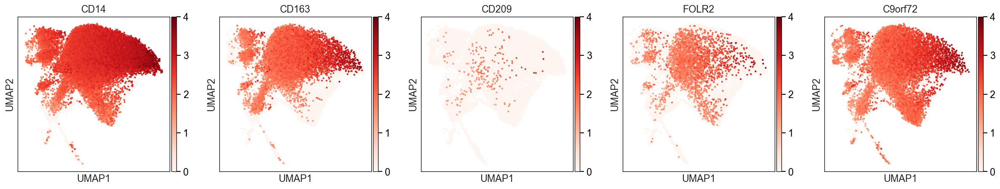

In [278]:
sc.settings.set_figure_params(dpi=60,dpi_save=600)
sc.tl.leiden(adata_MNPs, key_added='leiden_MNPs', resolution=0.7)
sc.pl.umap(
    adata_MNPs,
    color=['CD14','CD163','CD209','FOLR2','C9orf72'], frameon=True,cmap='Reds' ,ncols=5,size=25,vmax=4
    ,save='MNPs_marker_macro_1.pdf'
)


舍弃离群的点点点！！！！！

In [162]:
import scanpy as sc
import os
import math
import itertools
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
warnings.filterwarnings("ignore")
plt.rc('font',family='Arial')
sc.settings.verbosity = 3  # 输出提示信息
sc.logging.print_header()         
sc.settings.set_figure_params(dpi=100, facecolor='white', figsize=[4,4])# 设置输出图像格式

scanpy==1.10.2 anndata==0.10.8 umap==0.5.6 numpy==1.26.4 scipy==1.13.1 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.2 igraph==0.11.6 pynndescent==0.5.13


In [163]:
umap_embedding = adata_MNPs.obsm['X_umap']
umap_embedding = pd.DataFrame(umap_embedding, columns=['UMAP1', 'UMAP2'])
umap_embedding

,UMAP1,UMAP2
0,11.711095,8.412392
1,10.951341,11.810964
2,11.216675,11.710752
3,13.308026,10.284153
4,8.243081,4.864121
...,...,...
49691,17.736683,8.254812
49692,11.317150,7.387857
49693,12.004501,6.252234
49694,8.684342,9.669880


<Axes: xlabel='UMAP1', ylabel='UMAP2'>

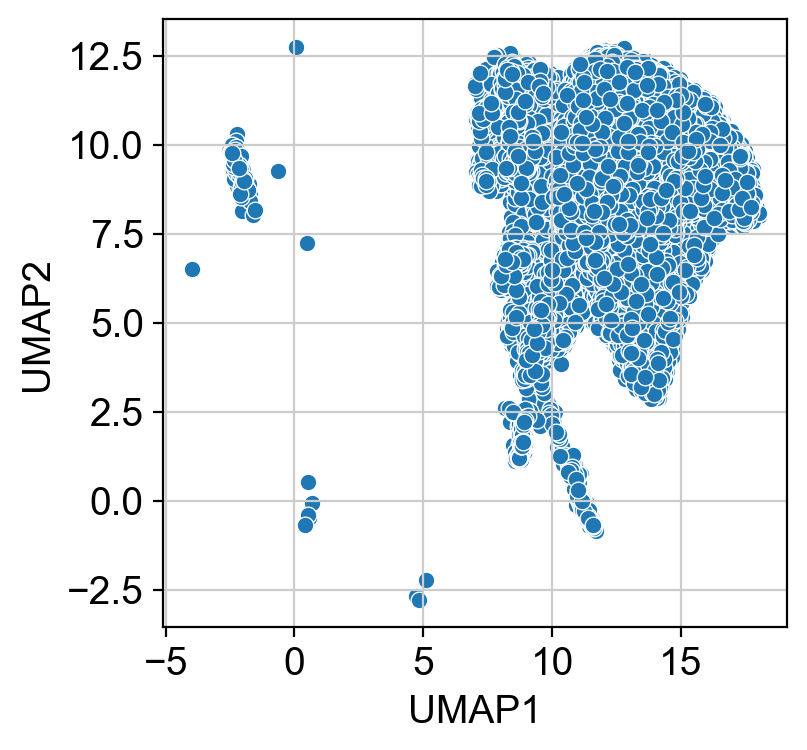

In [164]:
sns.scatterplot(
    umap_embedding, x="UMAP1", y="UMAP2"
)

In [165]:
umap_embedding["group"] = ["abandon" if x <=5.5 else "save" for x in umap_embedding["UMAP1"]]

<Axes: xlabel='UMAP1', ylabel='UMAP2'>

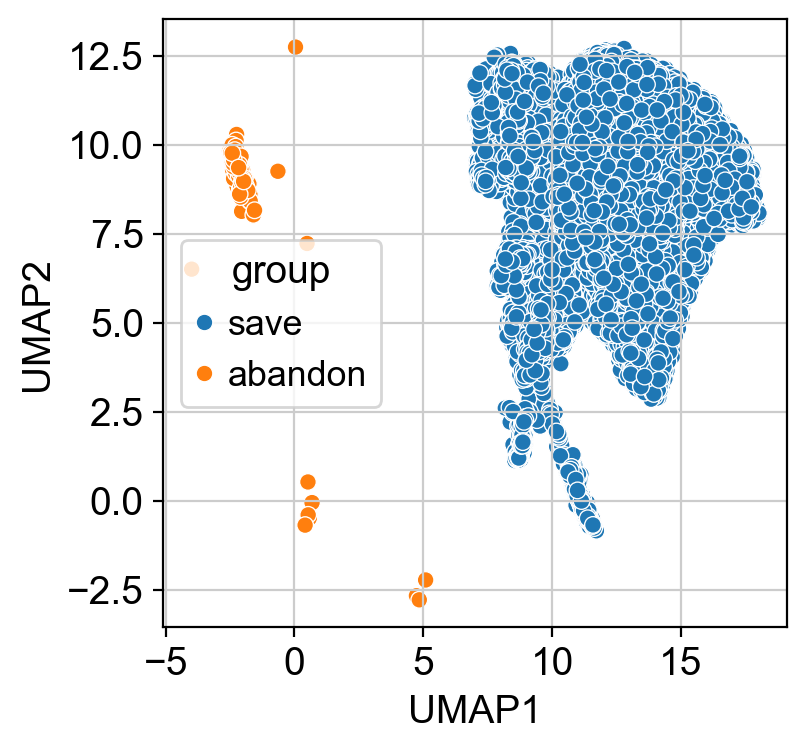

In [166]:
sns.scatterplot(
    umap_embedding, x="UMAP1", y="UMAP2", hue="group"
)

In [167]:
ab_index = list(umap_embedding[umap_embedding["group"]=="abandon"].index)
len(ab_index)

105

In [168]:
adata_MNPs.obs["CellID"] = adata_MNPs.obs.index
adata_MNPs.obs

,orig.ident,nCount_RNA,nFeature_RNA,orig.Cluster,ident,celltype,status,total_celltype,label.fine,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell_type,SASP,leiden_MNPs,CellID
AAACCTGAGCATGGCA-1,0,3645.0,1696,5,1,CD14,YA,Mono,CD14,1696,1696,2726.021582,0.0,0.0,1,MNPs,0.108778,0,AAACCTGAGCATGGCA-1
AAACCTGAGCTGATAA-1,0,3521.0,1612,5,1,CD14,YA,Mono,CD14,1612,1612,2633.419756,0.0,0.0,1,MNPs,-0.041143,1,AAACCTGAGCTGATAA-1
AAACCTGAGGCCCTTG-1,0,3597.0,1632,46,1,CD14,YA,Mono,CD14,1632,1632,2626.447678,0.0,0.0,1,MNPs,-0.022734,1,AAACCTGAGGCCCTTG-1
AAACCTGTCAACCATG-1,0,1332.0,798,9,1,CD14,YA,Mono,CD14,798,798,1881.289564,0.0,0.0,1,MNPs,0.004183,2,AAACCTGTCAACCATG-1
AAACCTGTCTCGCTTG-1,0,12062.0,3887,24,1,BC Memory,YA,BC,BC Memory,3887,3887,3640.698984,0.0,0.0,13,MNPs,-0.033179,5,AAACCTGTCTCGCTTG-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTCTTGTCC-22,0,610.0,430,9,22,CD14,ACR,Mono,CD14,430,430,1298.767928,0.0,0.0,1,MNPs,0.058247,4,TTTGTCAGTCTTGTCC-22
TTTGTCAGTGCCTGGT-22,0,5269.0,1986,12,22,CD14,ACR,Mono,CD14,1986,1986,2839.006683,0.0,0.0,1,MNPs,0.348635,0,TTTGTCAGTGCCTGGT-22
TTTGTCAGTGCTGTAT-22,0,7460.0,2621,12,22,CD14,ACR,Mono,CD14,2621,2621,3134.860614,0.0,0.0,6,MNPs,0.345559,3,TTTGTCAGTGCTGTAT-22
TTTGTCAGTTACCGAT-22,0,7801.0,2666,16,22,CD14,ACR,Mono,CD14,2666,2666,3115.823592,0.0,0.0,9,MNPs,0.458973,7,TTTGTCAGTTACCGAT-22


In [169]:
ab_cellid = [adata_MNPs.obs.iloc[i]['CellID'] for i in ab_index]
len(ab_cellid)

105

In [170]:
adata_MNPs.shape

(49696, 2535)

In [171]:
adata_MNPs = adata_MNPs[~adata_MNPs.obs['CellID'].isin(ab_cellid)]
adata_MNPs.shape

(49591, 2535)

In [156]:
# 暂时保存……？
adata_MNPs.write('05_MNPs_anno_temp.h5ad')
adata_MNPs

View of AnnData object with n_obs × n_vars = 49591 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type', 'SASP', 'CellID'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'ident_colors', 'label.fine_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [170]:
adata_dd = adata_MNPs_Aging[adata_MNPs_Aging.obs['ident'].isin(['1', '9'])]
adata_dd


View of AnnData object with n_obs × n_vars = 4047 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'ident_colors', 'label.fine_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'MNPs_AA_VS_YA_rank_genes_groups'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [171]:
adata_dd.write('07_small.h5ad')
adata_dd

View of AnnData object with n_obs × n_vars = 4047 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'ident_colors', 'label.fine_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'MNPs_AA_VS_YA_rank_genes_groups'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

running Leiden clustering
    finished: found 13 clusters and added
    'leiden_MNPs', the cluster labels (adata.obs, categorical) (0:00:09)


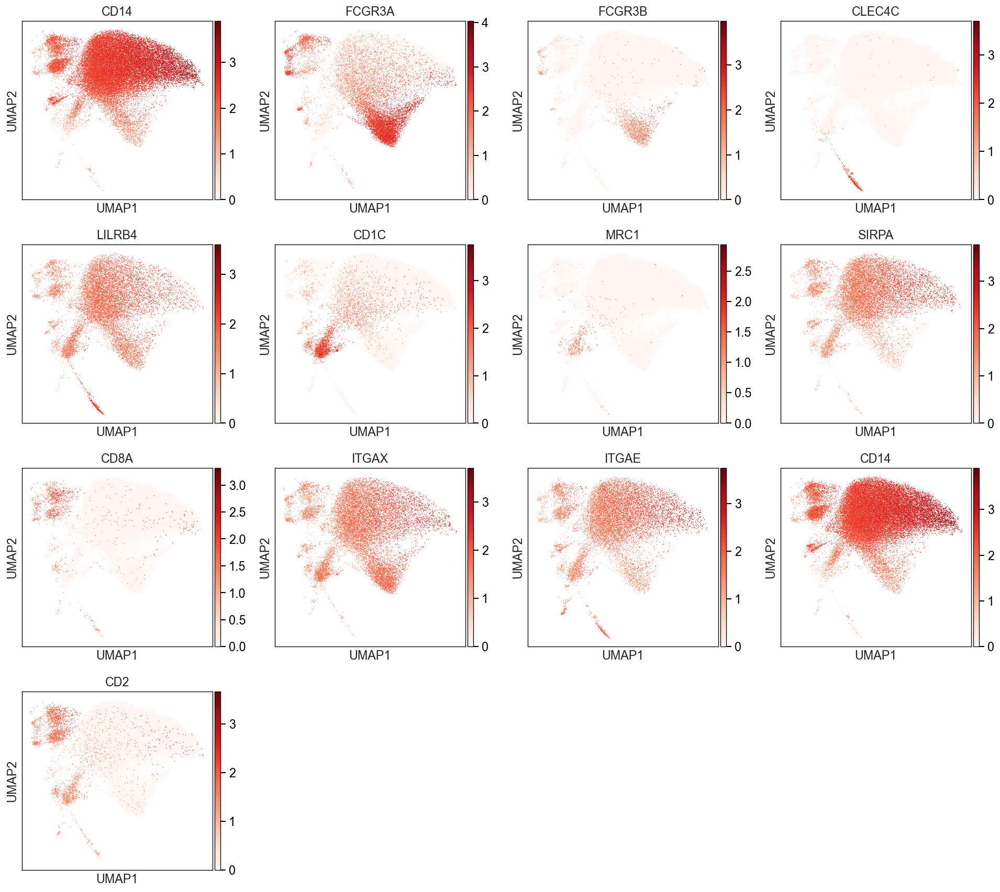

In [218]:
sc.tl.leiden(adata_MNPs, key_added='leiden_MNPs', resolution=0.7)
#sc.settings.set_figure_params(dpi=60,dpi_save=600)
sc.pl.umap(
    adata_MNPs,
    cmap='Reds',
    color=['CD14', 'FCGR3A','FCGR3B', 'CLEC4C',
    'LILRB4', 'CD1C','MRC1', 'SIRPA', 'CD8A','ITGAX','ITGAE', 'CD14','CD2'],save='MNPs_marker1.pdf'
)

#sc.settings.set_figure_params(dpi=60,dpi_save=600)
#sc.pl.dotplot(
    #adata_MNPs, ['CD14', 'FCGR3A','FCGR3B', 'CLEC4C',
    #'LILRB4', 'CD1C','MRC1', 'SIRPA', 'CD8A','ITGAX','ITGAE', 'CD14','CD2'], groupby='leiden_MNPs',
    #standard_scale='var', cmap='bwr', swap_axes=True,
   # dendrogram=True,save='MNP_markers2.pdf')

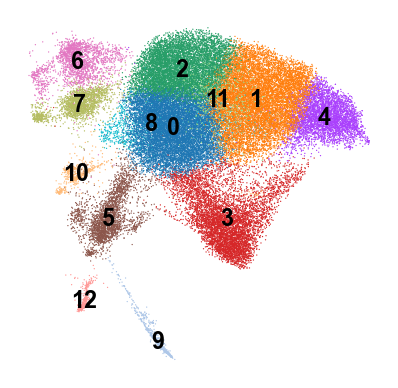

In [174]:
sc.settings.set_figure_params(dpi=60,dpi_save=300)
sc.pl.umap(adata_MNPs, color=['leiden_MNPs'], title='',frameon=False,legend_loc='on data',save='Leiden_MNPs.pdf')

In [ ]:
def get_raw_exp(adata_MNPs, target_genes):
    # 切片目标基因的 raw adata数据
    subad = adata_MNPs.raw.to_adata()[:, target_genes]
    # 得到基因表达矩阵
    mat = pd.DataFrame(
        data=subad.X.todense(), index=subad.obs_names, columns=subad.var_names
    )
    # 添加样本和细胞亚群分类信息
    gene_exp = pd.concat(
        [mat.loc[:, target_genes], subad.obs['leiden_MNPs'], subad.obs['ident']], axis=1
    )
    return gene_exp

gene_exp = get_raw_exp(adata_MNPs, target_genes=['CD14', 'FCGR3A','FCGR3B', 'CLEC4C',
    'LILRB4', 'CD1C','MRC1', 'SIRPA', 'CD8A','ITGAX','ITGAE', 'CD14','CD2'])
gene_exp.head()

In [176]:
import scipy
import seaborn as sns
import textwrap
sns.set_style("ticks")
sns.set_context("notebook", font_scale=1)
plt.rcParams["figure.figsize"] = [4, 4]
plt.rcParams["figure.autolayout"] = True
# rc={"font.family": 'Arial'}

In [177]:
adata_MNPs.obs['cell_type'] = (
    adata_MNPs.obs['leiden_MNPs']
    .map(lambda x: {        
        '0': 'CD14+ Mono',
        '1': 'CD14+ Mono',
        '2': 'CD14+ Mono',
        '3': 'CD16+ Mono',

        '4': 'CD14+ Mono',
        '5': 'cDC',

        '6': 'cDC',
        '7': 'cDC',
        '8': 'CD14+ Mono',
        '9': 'pDC',
        '10': 'cDC',
        '11': 'CD14+ Mono',
        '12': 'pDC'

        }.get(x, x))
    .astype("category")
)

adata_MNPs.obs.groupby('status')['cell_type'].value_counts(normalize=True)

status  cell_type 
YA      CD14+ Mono    0.665563
        cDC           0.183278
        CD16+ Mono    0.120116
        pDC           0.031043
AA      CD14+ Mono    0.675853
        cDC           0.166773
        CD16+ Mono    0.138529
        pDC           0.018846
YCR     CD14+ Mono    0.747451
        cDC           0.138441
        CD16+ Mono    0.105229
        pDC           0.008879
ACR     CD14+ Mono    0.777364
        CD16+ Mono    0.130364
        cDC           0.084182
        pDC           0.008091
Name: proportion, dtype: float64

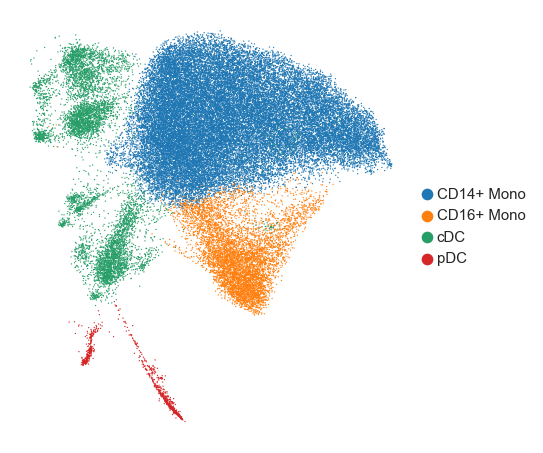

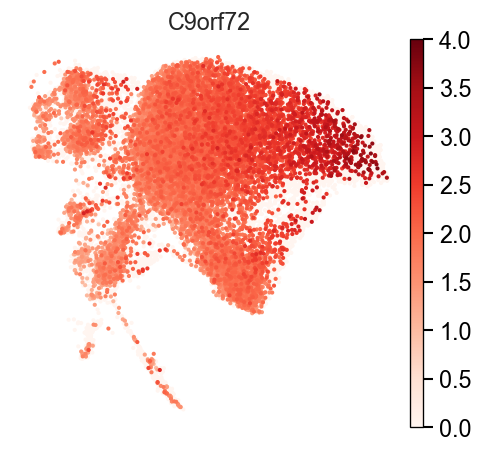

In [186]:
sc.settings.set_figure_params(dpi=60,figsize=(4.75,4),dpi_save=300)
sc.pl.umap(adata_MNPs, color=['cell_type'], ncols=1,legend_fontsize='9', title='',frameon=False,save='celltypist_MNPs.pdf')
sc.settings.set_figure_params(dpi=60,figsize=(4.25,4),dpi_save=300)
sc.pl.umap(adata_MNPs, color=['C9orf72'], ncols=2,cmap='Reds',frameon=False,size=25,vmax=4,save='C9_exp_MNPs_1.pdf')

In [187]:
CD14_index = list(adata_MNPs[adata_MNPs.obs['cell_type']=='CD14+ Mono'].obs.index)
len(CD14_index)

34944

In [188]:
CD16_index = list(adata_MNPs[adata_MNPs.obs['cell_type']=='CD16+ Mono'].obs.index)
len(CD16_index)

6355

In [189]:
pDC_index = list(adata_MNPs[adata_MNPs.obs['cell_type']=='pDC'].obs.index)
len(pDC_index)

903

In [190]:
cDC_index = list(adata_MNPs[adata_MNPs.obs['cell_type']=='cDC'].obs.index)
len(cDC_index)

7389

In [191]:
adata.obs['cell_type'] = adata.obs['cell_type'].cat.set_categories([
    'CD8+ T cells', 'CD4+ T cells', 'NK cells', 
    'Treg cells', 'B cells',
    'Plasma cells', 'γΔ T cells', 'RBCs', 'Platelets','CD14+ Mono','CD16+ Mono','pDC','cDC'
])

In [192]:
for i in range(len(adata.obs.index)):
    if adata.obs.index[i] in CD14_index:
        adata.obs['cell_type'][i] = 'CD14+ Mono'
    elif adata.obs.index[i] in CD16_index:
        adata.obs['cell_type'][i] = 'CD16+ Mono'
    elif adata.obs.index[i] in pDC_index:
        adata.obs['cell_type'][i] = 'pDC'
    elif adata.obs.index[i] in cDC_index:
        adata.obs['cell_type'][i] = 'cDC'


adata.obs.groupby('status')['cell_type'].value_counts(normalize=True)

status  cell_type   
YA      CD4+ T cells    0.372317
        NK cells        0.151705
        CD8+ T cells    0.142073
        B cells         0.112632
        CD14+ Mono      0.102161
        γΔ T cells      0.031754
        cDC             0.028133
        CD16+ Mono      0.018437
        Platelets       0.016036
        Treg cells      0.015845
        pDC             0.004765
        Plasma cells    0.003571
        RBCs            0.000572
AA      CD4+ T cells    0.262131
        NK cells        0.190432
        CD8+ T cells    0.168625
        CD14+ Mono      0.158392
        B cells         0.079236
        cDC             0.039085
        CD16+ Mono      0.032465
        Platelets       0.020099
        Treg cells      0.018871
        γΔ T cells      0.016875
        Plasma cells    0.005013
        pDC             0.004417
        RBCs            0.004359
YCR     CD4+ T cells    0.272695
        CD14+ Mono      0.233021
        CD8+ T cells    0.141729
        NK cells      

In [194]:
adata

AnnData object with n_obs × n_vars = 203570 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type', 'SASP'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'ident_colors', 'label.fine_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

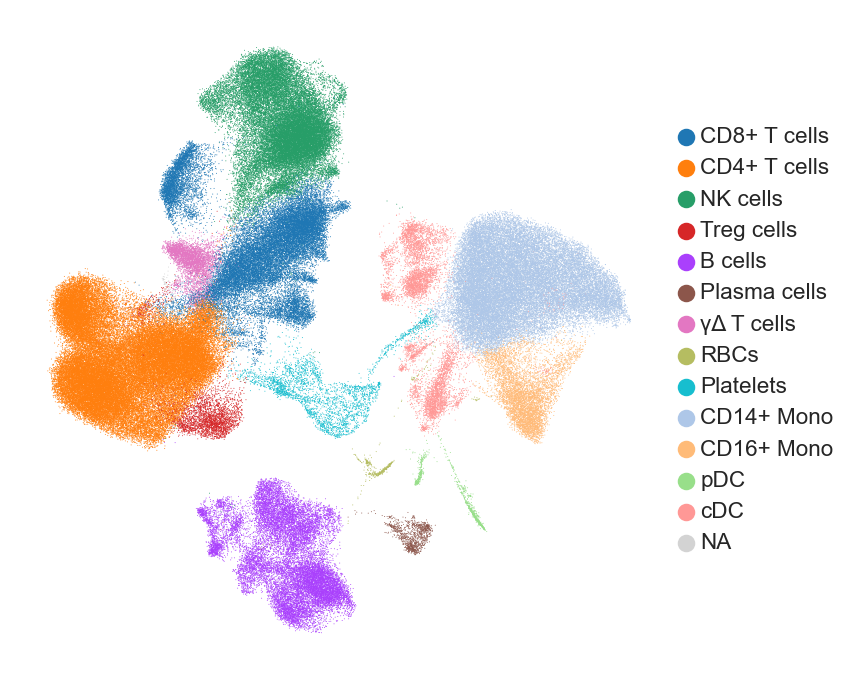

In [205]:
sc.settings.set_figure_params(dpi=90,figsize=(5,4),dpi_save=600)
sc.pl.umap(adata, color=['cell_type'],legend_fontsize='9', title=''
           ,frameon=False,ncols=1,save='celltypist_2.pdf')

In [206]:
adata.obs["cell_type"]

AAACCTGAGCATGGCA-1       CD14+ Mono
AAACCTGAGCGTAGTG-1     CD4+ T cells
AAACCTGAGCTGATAA-1       CD14+ Mono
AAACCTGAGGCCCTTG-1       CD14+ Mono
AAACCTGAGGGCTCTC-1         NK cells
                           ...     
TTTGTCAGTGCTGTAT-22      CD16+ Mono
TTTGTCAGTTACCGAT-22             cDC
TTTGTCATCCACGCAG-22      CD14+ Mono
TTTGTCATCCCAACGG-22    CD8+ T cells
TTTGTCATCGTACGGC-22    CD4+ T cells
Name: cell_type, Length: 203570, dtype: category
Categories (13, object): ['CD8+ T cells', 'CD4+ T cells', 'NK cells', 'Treg cells', ..., 'CD14+ Mono', 'CD16+ Mono', 'pDC', 'cDC']

In [207]:
adata.obs.head()

,orig.ident,nCount_RNA,nFeature_RNA,orig.Cluster,ident,celltype,status,total_celltype,label.fine,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell_type,SASP
AAACCTGAGCATGGCA-1,0,3645.0,1696,5,1,CD14,YA,Mono,CD14,1696,1696,2726.021582,0.0,0.0,1,CD14+ Mono,0.108778
AAACCTGAGCGTAGTG-1,0,966.0,647,11,1,CD4 Tem,YA,TC,CD4 Tem,647,647,1671.360650,0.0,0.0,0,CD4+ T cells,-0.145375
AAACCTGAGCTGATAA-1,0,3521.0,1612,5,1,CD14,YA,Mono,CD14,1612,1612,2633.419756,0.0,0.0,1,CD14+ Mono,-0.041143
AAACCTGAGGCCCTTG-1,0,3597.0,1632,46,1,CD14,YA,Mono,CD14,1632,1632,2626.447678,0.0,0.0,1,CD14+ Mono,-0.022734
AAACCTGAGGGCTCTC-1,0,1649.0,1011,2,1,NK3,YA,NK,NK3,1011,1011,2182.371438,0.0,0.0,2,NK cells,-0.025081


normalizing counts per cell
    finished (0:00:00)


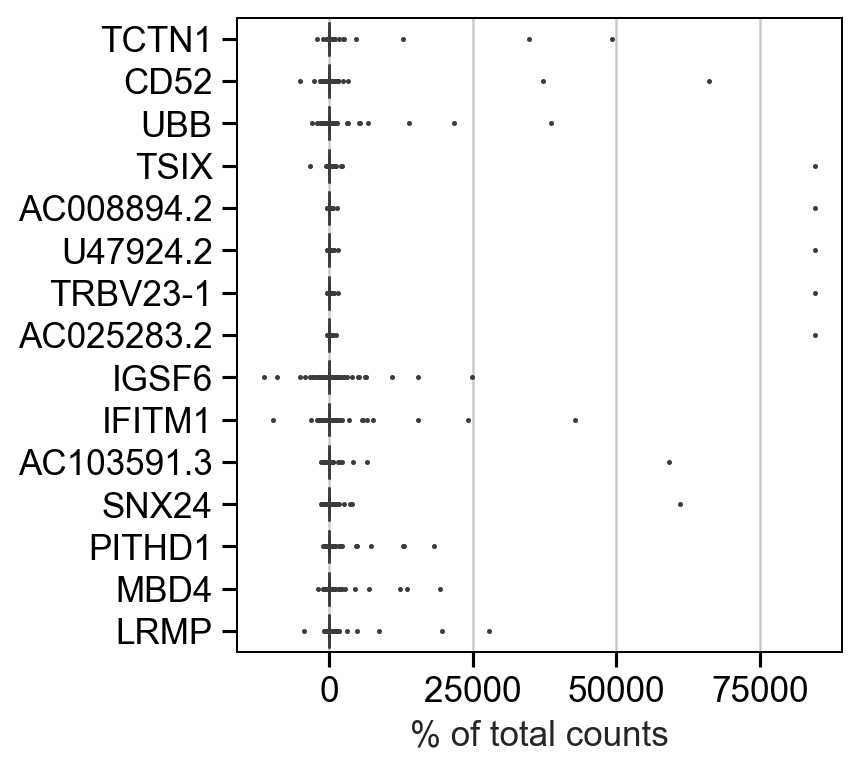

In [208]:
sc.pl.highest_expr_genes(adata_MNPs, n_top=15)

In [102]:
adata_sub = adata[adata.obs['status'].isin(['YA', 'AA'])]
adata_sub



View of AnnData object with n_obs × n_vars = 165963 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type', 'SASP'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'dendrogram_leiden', 'hvg', 'ident_colors', 'label.fine_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [103]:
def get_raw_exp(adata_MNPs_Aging, target_genes):
# 切片目标基因的 raw adata数据
  subad = adata_MNPs_Aging.raw.to_adata()[:, target_genes]
# 得到基因表达矩阵
  mat = pd.DataFrame(
    data=subad.X.todense(), index=subad.obs_names, columns=subad.var_names
    )
# 添加样本和细胞亚群分类信息
  gene_exp = pd.concat(
     [mat.loc[:, target_genes], subad.obs['cell_type'], subad.obs['status']], axis=1
   )
  return gene_exp

gene_exp = get_raw_exp(adata_MNPs_Aging, target_genes=['C9orf72', 'TMEM173'])
gene_exp.head()

,C9orf72,TMEM173,cell_type,status
AAACCTGAGCATGGCA-1,0.000000,1.765122,MNPs,YA
AAACCTGAGCTGATAA-1,1.809816,0.000000,MNPs,YA
AAACCTGAGGCCCTTG-1,0.000000,1.802191,MNPs,YA
AAACCTGTCAACCATG-1,0.000000,0.000000,MNPs,YA
AAACCTGTCTCGCTTG-1,0.000000,0.000000,MNPs,YA


In [585]:
#sc.tl.rank_genes_groups(adata_sub, groupby='ident',
#key_added='MNPs_AA_VS_YA_rank_genes_groups_ident',
#method='wilcoxon')
# sc.pl.rank_genes_groups_violin(adata, groups='KO', n_genes=10, key='KOvsCtrl_rank_genes_groups')


ranking genes
    finished: added to `.uns['MNPs_AA_VS_YA_rank_genes_groups_ident']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:41)


In [150]:
sc.tl.rank_genes_groups(adata_MNPs_Aging, 'status', groups=['AA'], reference='YA',
key_added='MNPs_AA_VS_YA_rank_genes_groups',
method='wilcoxon')
# sc.pl.rank_genes_groups_violin(adata, groups='KO', n_genes=10, key='KOvsCtrl_rank_genes_groups')


ranking genes
    finished: added to `.uns['MNPs_AA_VS_YA_rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:49)


In [1487]:
adata_sub

AnnData object with n_obs × n_vars = 165963 × 2535
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'orig.Cluster', 'ident', 'celltype', 'status', 'total_celltype', 'label.fine', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type', 'Lysosome', 'SASP'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dendrogram_leiden', 'hvg', 'ident_colors', 'label.fine_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'MNPs_AA_VS_YA_rank_genes_groups'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [151]:
result = adata_MNPs_Aging.uns['MNPs_AA_VS_YA_rank_genes_groups']
groups = result['names'].dtype.names
print('MNPs_AA_VS_YA_rank_genes_groups_ident:')
dataframe = pd.DataFrame(
{group + '_' + key : result[key][group] # create new dictionary
 for group in groups for key in ['names', 'scores', 'pvals', 'logfoldchanges', 'pvals_adj']} )
display(dataframe.head(10))  
dataframe.to_excel('20241220_E0771_AA_YA_MNPs_High_VS_Low_rank_genes_wilcoxon.xlsx')

MNPs_AA_VS_YA_rank_genes_groups_ident:


,AA_names,AA_scores,AA_pvals,AA_logfoldchanges,AA_pvals_adj
0,NFKBIA,58.532078,0.000000e+00,1.126155,0.000000e+00
1,RETN,49.165756,0.000000e+00,1.952888,0.000000e+00
2,HLA-DQA2,37.079632,5.983223e-301,2.981252,4.563404e-297
3,IER3,36.110306,1.562853e-285,1.825379,8.939913e-282
4,IFITM2,35.694145,4.872657e-279,0.683328,2.229825e-275
5,HLA-C,35.357006,7.825252e-274,0.203119,2.984160e-270
6,IFITM3,33.799709,1.991713e-250,0.640255,6.510340e-247
7,GAPDH,33.499954,4.827247e-246,0.241859,1.380653e-242
8,HIGD2A,32.429821,1.042990e-230,0.486792,2.386466e-227
9,FTH1,31.962597,3.610771e-224,0.168246,7.510732e-221


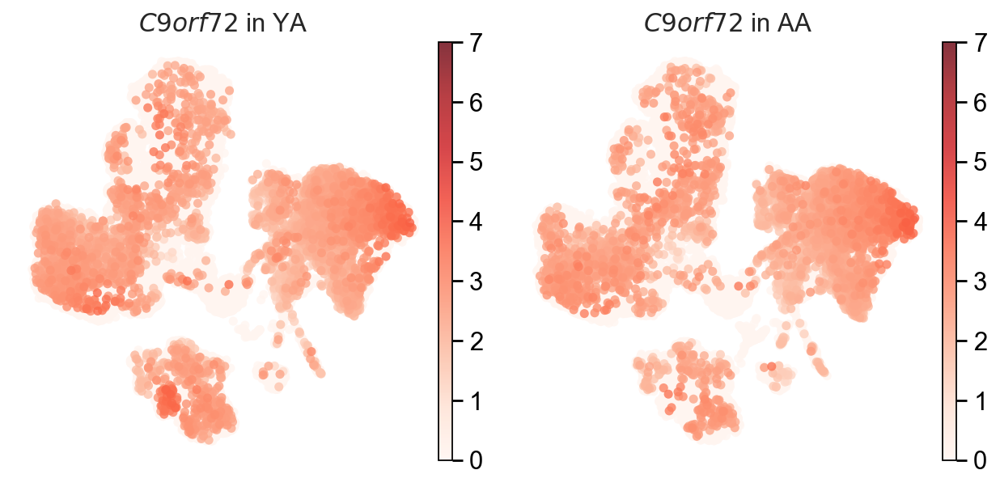

In [1489]:
genes_list = [
    'C9orf72'
]
vmax_list =  [
    7, 2, 1
]

sc.settings.set_figure_params(dpi=80)
for i in range(len(genes_list)):
    split_umap(
        adata_sub, 
        split_by='status',color=genes_list[i], 

        vmax=vmax_list[i], 
        #colorbar_loc=None, # 不显示颜色条，在ppt中自己画一个示意
        ncol=2, 
        alpha=.8, 
        size=100,
        frameon=False, 
        cmap='Reds'
    )

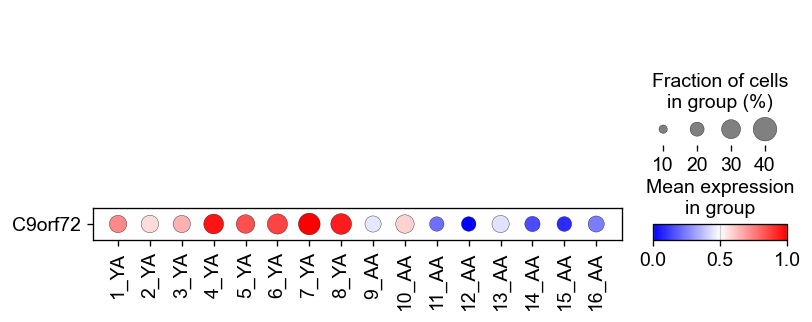

In [77]:
sc.pl.dotplot(
    adata_MNPs_Aging, ['C9orf72'], groupby=['ident','status'],
    standard_scale='var', cmap='bwr', swap_axes=True,
    dendrogram=False
)

In [82]:
adata_MNPs_Aging.obs

,orig.ident,nCount_RNA,nFeature_RNA,orig.Cluster,ident,celltype,status,total_celltype,label.fine,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell_type,combined
AAACCTGAGCATGGCA-1,0,3645.0,1696,5,1,CD14,YA,Mono,CD14,1696,1696,2726.021582,0.0,0.0,1,MNPs,YA_1
AAACCTGAGCTGATAA-1,0,3521.0,1612,5,1,CD14,YA,Mono,CD14,1612,1612,2633.419756,0.0,0.0,1,MNPs,YA_1
AAACCTGAGGCCCTTG-1,0,3597.0,1632,46,1,CD14,YA,Mono,CD14,1632,1632,2626.447678,0.0,0.0,1,MNPs,YA_1
AAACCTGTCAACCATG-1,0,1332.0,798,9,1,CD14,YA,Mono,CD14,798,798,1881.289564,0.0,0.0,1,MNPs,YA_1
AAACCTGTCTCGCTTG-1,0,12062.0,3887,24,1,BC Memory,YA,BC,BC Memory,3887,3887,3640.698984,0.0,0.0,13,MNPs,YA_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAAGGATGGAA-16,0,2400.0,1095,5,16,CD14,AA,Mono,CD14,1095,1095,2131.172381,0.0,0.0,1,MNPs,AA_16
TTTGTCACACAGGAGT-16,0,4977.0,1966,5,16,CD14,AA,Mono,CD14,1966,1966,2827.992965,0.0,0.0,1,MNPs,AA_16
TTTGTCAGTGTTCGAT-16,0,4148.0,1821,5,16,CD14,AA,Mono,CD14,1821,1821,2773.252708,0.0,0.0,1,MNPs,AA_16
TTTGTCATCCCAGGTG-16,0,4758.0,1973,5,16,CD14,AA,Mono,CD14,1973,1973,2865.630827,0.0,0.0,1,MNPs,AA_16


In [88]:
import scanpy as sc
import pandas as pd
import numpy as np

def get_expression_data(adata_MNPs_Aging, target_genes):
    # 检查所有目标基因是否存在
    missing_genes = [gene for gene in target_genes if gene not in adata_MNPs_Aging.raw.var_names]
    if missing_genes:
        print(f"Warning: The following target genes are missing: {missing_genes}")

    # 提取目标基因的 raw adata数据
    subad = adata_MNPs_Aging.raw.to_adata()[:, target_genes]

    # 得到基因表达矩阵
    mat = pd.DataFrame(
        data=subad.X.todense(), index=subad.obs_names, columns=subad.var_names
    )

    return mat

# 假设 adata_MNPs_Aging 已经定义并加载了数据
target_genes = ['C9orf72', 'PCBP1', 'CLEC12A']  # 可以添加其他目标基因
gene_exp_matrix = get_expression_data(adata_MNPs_Aging, target_genes)

# 将表达矩阵转换为 DataFrame，并合并 ident 信息
gene_exp = pd.concat(
    [gene_exp_matrix, adata_MNPs_Aging.obs[['cell_type', 'ident']]], axis=1
)

# 确认 ident 列存在
if 'ident' not in gene_exp.columns:
    print("'ident' column is not found in gene expression DataFrame!")
else:
    # 计算每个基因的平均表达值和细胞占比，仅根据 ident
    results = {}
    
    for gene in target_genes:
        if gene in gene_exp.columns:
            avg_exp = gene_exp.groupby('ident')[gene].mean()  # 根据 ident 计算平均表达值
            cell_fraction = (gene_exp[gene] > 0).groupby(gene_exp['ident']).mean() * 100  # 表达的细胞比例
            
            results[gene] = {
                'avg_exp': avg_exp,
                'cell_fraction': cell_fraction
            }

    # 将结果整理为 DataFrame
    result_df = pd.DataFrame()

    # 遍历结果字典，并构建结果 DataFrame
    for gene, result in results.items():
        result_df[gene + '_avg_exp'] = result['avg_exp']
        result_df[gene + '_cell_fraction'] = result['cell_fraction']

    # 导出为 CSV 文件
    result_df.to_csv('gene_expression_results.csv', index=True)
    print("Results have been exported to 'gene_expression_results.csv'.")

    # 打印结果
    print(result_df)


Results have been exported to 'gene_expression_results.csv'.
       C9orf72_avg_exp  C9orf72_cell_fraction  PCBP1_avg_exp  \
ident                                                          
1             0.547914              26.595073       2.047987   
2             0.510595              26.909414       2.072193   
3             0.529840              26.390805       2.075587   
4             0.597584              31.616688       1.693863   
5             0.572049              29.000000       1.681671   
6             0.576764              32.507740       1.867786   
7             0.607057              35.695986       2.035382   
8             0.594759              33.694959       2.109740   
9             0.484522              24.195570       1.974585   
10            0.515621              28.784441       1.413608   
11            0.432506              20.626223       1.612032   
12            0.384552              20.985011       1.212226   
13            0.483527              26.2563

In [78]:
print(adata_MNPs_Aging.obs.groupby(['ident', 'status']).size())


ident  status
1      AA           0
       YA        1583
2      AA           0
       YA        1126
3      AA           0
       YA        2175
4      AA           0
       YA        1534
5      AA           0
       YA        1400
6      AA           0
       YA        1292
7      AA           0
       YA        1171
8      AA           0
       YA        1567
9      AA        2393
       YA           0
10     AA        3085
       YA           0
11     AA        2555
       YA           0
12     AA        2335
       YA           0
13     AA        2567
       YA           0
14     AA        2010
       YA           0
15     AA        2613
       YA           0
16     AA        2658
       YA           0
dtype: int64


In [1491]:
SASP_genes = [
     'CDKN1A', 'CDKN2A', 'IRF7','IGFBP7','CXCL1', 'CXCL2', 'CXCL6', 'CXCL8',
    'TNF', 'MMP1',
    'CCL3' , 'CCL4' ,'ICAM1', 'VEGFA','IL1B', 'IL6','IL23A', 'IL27','TGFB1'
]

In [62]:
def get_raw_exp(adata_MNPs_Aging, target_genes):
    # 切片目标基因的 raw adata数据
    subad = adata_MNPs_Aging.raw.to_adata()[:, target_genes]
    # 得到基因表达矩阵
    mat = pd.DataFrame(
        data=subad.X.todense(), index=subad.obs_names, columns=subad.var_names
    )
    # 添加样本和细胞亚群分类信息
    gene_exp = pd.concat(
        [mat.loc[:, target_genes], subad.obs['cell_type'], subad.obs['ident']], axis=1
    )
    return gene_exp

gene_exp = get_raw_exp(adata_MNPs_Aging, target_genes=['PCBP1', 'CLEC12A', 'PCBP2', 'DUSP6', 'MNDA', 'TXNIP', 'NAP1L1', 'EIF3E', 'NBPF14', 'SNX3', 'KLF6', 'FOS', 'CALM2', 'ACTR3', 'ACTR2', 'KLF4', 'EIF2S3', 'AP1S2', 'DYNLL1', 'CYBB', 'CDC42', 'XRN2', 'HMGB1', 'RSRP1', 'CD36', 'MEF2C', 'CANX', 'HNRNPA2B1', 'N4BP2L2', 'HNRNPU', 'NBPF10', 'ELF1', 'DDX17', 'PNRC1', 'SDCBP', 'SKP1', 'PTPRC', 'CAPZA2', 'CLEC4A', 'ARPC5', 'CAPZA1', 'SET', 'CD48', 'KHDRBS1', 'SFPQ', 'RGS18', 'BTG1', 'CD164', 'RTN4', 'FOSB', 'SEPT7', 'ARF6', 'ATP6AP2', 'SRSF11', 'ARL5A', 'TAX1BP1', 'PTGES3', 'VPS35', 'LYST', 'SRP9', 'KCTD12', 'HSP90B1', 'HSD17B11', 'JMJD1C', 'YWHAZ', 'NPM1', 'IFI16', 'P2RY13', 'LAPTM4A', 'SMCHD1', 'CD302', 'AC020656.1', 'LUC7L3', 'ITM2B', 'GABARAPL2', 'RBM3', 'OSTF1', 'YWHAH', 'SRRM1', 'MFSD1', 'TRAM1', 'ACAP2', 'HLA-DRA', 'TTC3', 'HMGN2', 'RAP1A', 'MBNL1', 'BZW1', 'MALAT1', 'KRT10', 'H2AFY', 'PRDX3', 'SELENOF', 'CAT', 'SCP2', 'EVI2B', 'EIF3A', 'FAM96A', 'RAP2B', 'OSTC', 'HMGN1', 'RBM39', 'HSP90AB1', 'ATRX', 'SPTSSA', 'ARL6IP5', 'EMB', 'MIS18BP1', 'FNTA', 'UBE2J1', 'NKTR', 'ABRACL', 'MYADM', 'TTC14', 'EIF4B', 'SCAF11', 'ERH', 'TMEM50A', 'SKAP2', 'CPNE3', 'ECHDC1', 'CNIH1', 'TMEM123', 'RSL1D1', 'MARCH1', 'SHOC2', 'EIF4A2', 'METTL9', 'HSP90AA1', 'SUMO1', 'STK4', 'GPBP1', 'CPVL', 'PCF11', 'SYNCRIP', 'WASHC4', 'UVRAG', 'CELF2', 'DAPP1', 'GLIPR1', 'GLUD1', 'ASH1L', 'ANXA5', 'TMEM154', 'CEP350', 'SUMO2', 'CITED2', 'RBBP4', 'SEC61G', 'UFM1', 'SNAP23', 'LYN', 'SNX10', 'SSR1', 'ATP5MPL', 'RSL24D1', 'STX7', 'SGK1', 'PTBP3', 'EIF1B', 'ATP6V1G1', 'CSDE1', 'WDFY2', 'ATM', 'CHD9', 'YBEY', 'NRBF2', 'YBX1', 'CYBA', 'CMPK1', 'SHTN1', 'GPR65', 'TAF7', 'ZNF207', 'GAPT', 'LAMTOR3', 'TOMM20', 'HNRNPH1', 'SRSF2', 'SRGN', 'COMMD8', 'OCIAD1', 'TNFAIP8', 'APPL1', 'ANKRD44', 'PAPOLA', 'GDI2', 'VMP1', 'PPP1CC', 'MOB1A', 'SEPT2', 'KTN1', 'LSM6', 'TNRC6B', 'HDAC2', 'ARF4', 'EIF3M', 'MDM4', 'SMIM14', 'POLR2J3.1', 'CD180', 'DICER1', 'BICD2', 'BCLAF1', 'LYPLA1', 'GTF2A2', 'PPP1R2', 'PTP4A2', 'SARAF', 'EVI2A', 'PPP6C', 'NCL', 'PLXDC2', 'PRPF38B', 'TMEM165', 'KIAA1551', 'NBPF19', 'HNRNPA3', 'TNKS2', 'CD53', 'SLC40A1', 'ITGB1', 'ESD', 'RNASE6', 'LSM14A', 'IFNGR1', 'RNMT', 'CTSS', 'RAB32', 'NIPSNAP3A', 'ITSN2', 'TMED10', 'RBL2', 'SRSF9', 'NIPBL', 'HSPD1', 'PDCD10', 'TMCO1', 'ME2', 'PBRM1', 'ADD3', 'EIF1AX', 'GOLPH3', 'HDAC9', 'SETX', 'SNX6', 'MORF4L1', 'RAP1B', 'RNPEP', 'CD46', 'SENP6', 'TERF2IP', 'LITAF', 'CD86', 'RHEB', 'TLE4', 'PHF20L1', 'PPIP5K2', 'TMEM243', 'NR3C1', 'CCNL1', 'ARID1B', 'SNRPE', 'SS18L2', 'ZRANB2', 'THOC2', 'PDIA6', 'MAT2A', 'OSBPL8', 'KRCC1', 'C9orf72', 'PSMA4', 'RANBP1', 'HNRNPR', 'HNRNPF', 'SCPEP1', 'TSC22D3', 'SPCS1', 'DHX36', 'STAG2', 'TMEM230', 'C1D', 'AHR', 'PPP4R3A', 'UBE3A', 'AP3B1', 'CCNI', 'MYL12A', 'YIPF4', 'COPB1', 'MAT2B', 'BPTF', 'IL13RA1', 'BIRC6', 'RTN3', 'MEAF6', 'UBXN4', 'CUL5', 'EPC1', 'TMEM167A'])
gene_exp.head()
#gene_exp.to_csv('gene exp.csv')
#df = pd.DataFrame(exp_1)
#df.to_excel('output.xlsx', index=False)

,PCBP1,CLEC12A,PCBP2,DUSP6,MNDA,TXNIP,NAP1L1,EIF3E,NBPF14,SNX3,...,IL13RA1,BIRC6,RTN3,MEAF6,UBXN4,CUL5,EPC1,TMEM167A,cell_type,ident
AAACCTGAGCATGGCA-1,1.765122,2.061667,2.557850,0.000000,1.765122,2.214075,2.061667,2.385483,0.000000,2.061667,...,2.061667,0.000000,0.000000,0.000000,2.061667,0.000000,0.000000,1.765122,MNPs,1
AAACCTGAGCTGATAA-1,2.105562,2.105562,2.599214,1.809816,2.528881,0.000000,2.105562,2.355976,0.000000,2.355976,...,1.809816,0.000000,2.355976,0.000000,0.000000,0.000000,1.809816,1.809816,MNPs,1
AAACCTGAGGCCCTTG-1,2.252035,0.000000,2.099469,0.000000,2.252035,2.351289,2.099469,2.423505,2.099469,1.802191,...,0.000000,0.000000,1.802191,0.000000,0.000000,0.000000,0.000000,1.802191,MNPs,1
AAACCTGTCAACCATG-1,2.957953,2.756376,2.756376,0.000000,3.016038,2.878419,0.000000,2.516100,0.000000,2.516100,...,0.000000,0.000000,2.516100,0.000000,0.000000,0.000000,0.000000,0.000000,MNPs,1
AAACCTGTCTCGCTTG-1,2.024655,0.000000,2.096270,0.000000,1.304333,2.197328,2.024655,2.050783,1.776592,2.116284,...,0.977748,0.977748,0.000000,1.488601,1.776592,0.977748,1.776592,1.488601,MNPs,1


In [30]:
exp_1=gene_exp[gene_exp['cell_type']=='MNPs'].groupby(['ident'], observed=True).mean(numeric_only=True)
exp_1.head()
#df = pd.DataFrame(exp_1)
#df.to_excel('output.xlsx', index=False)

,PCBP1,CLEC12A,PCBP2,DUSP6,MNDA,TXNIP,NAP1L1,EIF3E,NBPF14,SNX3,...,MAT2B,BPTF,IL13RA1,BIRC6,RTN3,MEAF6,UBXN4,CUL5,EPC1,TMEM167A
ident,,,,,,,,,,,,,,,,,,,,,
1,2.034734,1.210090,2.149088,0.892650,1.921350,2.076635,1.571038,1.724847,0.940518,1.431424,...,0.556681,0.557336,0.332166,0.459013,0.862396,0.590476,0.728857,0.270731,0.636209,0.839337
2,2.071120,0.917912,2.149720,0.963958,2.050130,2.117795,1.555124,1.789824,0.885895,1.531136,...,0.615633,0.673759,0.401653,0.489531,0.823151,0.636760,0.833267,0.317939,0.703509,1.010655
3,2.071213,1.446907,2.111508,1.014377,1.933670,2.053839,1.586825,1.639940,1.020661,1.573701,...,0.563911,0.580722,0.408568,0.449696,0.801004,0.552879,0.738632,0.294613,0.640577,0.896270
4,1.685529,1.518221,2.196176,1.158470,1.905983,2.066833,1.555841,1.614969,0.903247,1.746064,...,0.637218,0.658221,0.491978,0.491851,0.910962,0.683120,0.890737,0.368862,0.739472,0.867807
5,1.674683,0.851385,2.090290,1.439561,1.917449,1.945093,1.557755,1.684902,0.901279,1.531996,...,0.611806,0.630066,0.416038,0.552457,0.864760,0.530914,0.862039,0.321007,0.718794,0.952688


In [59]:
result = adata_MNPs_Aging[adata_MNPs_Aging.obs['cell_type']=='MNPs'].obs.groupby(['ident', 'status'], observed=True).agg({'SASP': 'mean'}).reset_index()
result.rename(columns = {'SASP_mean': 'SASP'}, inplace=True)
result

,ident,status,SASP
0,1,YA,-0.039849
1,2,YA,-0.047229
2,3,YA,-0.014160
3,4,YA,-0.029690
4,5,YA,-0.014124
5,6,YA,-0.037885
6,7,YA,-0.041070
7,8,YA,-0.040623
8,9,AA,-0.010793
9,10,AA,-0.009613


In [63]:
exp_2 = gene_exp[gene_exp['cell_type']=='MNPs'].groupby(['ident'], observed=True).agg({'C9orf72':[np.mean]}).reset_index()
exp_2.rename(columns = {'C9orf72': 'mean'}, inplace=True)
#exp_1.head()
exp_2
#df = pd.DataFrame(exp_1)
#df.to_excel('output.xlsx', index=False)

,ident,mean
,,mean
0,1,0.535839
1,2,0.508170
2,3,0.518800
3,4,0.583654
4,5,0.565205
5,6,0.567107
6,7,0.597027
7,8,0.581735
8,9,0.479332


In [ ]:
result = adata_MNPs_Aging[adata_MNPs_Aging.obs['cell_type']=='MNPs'].obs.groupby(['ident', 'status'], observed=True).agg({'SASP'}).reset_index()
result.rename(columns = {'SASP_mean': 'SASP'}, inplace=True)
#result.head()
result

AttributeError: 'SeriesGroupBy' object has no attribute 'SASP'

In [279]:
adata_AA = adata_MNPs[adata_MNPs.obs['status'].isin(['AA'])]
adata_YA = adata_MNPs[adata_MNPs.obs['status'].isin(['YA'])]